# Imports

In [1]:
# Necessary Modules for SPARK
import scipy.io as sio
import scipy as sp
import numpy as np
import matplotlib.pyplot as plt
from numpy import linalg as LA
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchsummary import summary
from torchviz import make_dot
import torch.optim as optim
import pandas as pd
import warnings
import nvgpu
from PIL import Image

In [2]:
##################################################################################################
#########(The code in this cell is copied from the code supplied with the original paper)#########
##################################################################################################

# Necessary Modulse for RAKI 
#import print_function
import tensorflow as tf
import scipy.io as sio
import numpy as np
import numpy.matlib
from tensorflow.examples.tutorials.mnist import input_data
import time
import os
#os.environ["CUDA_VISIBLE_DEVICES"] = "1"

# Utils

## Mosaic

In [3]:
# Notes
#-------
# 1) Given an input image of shape [num_images, N1, N2], concatenates all images in a mosaic and displays it
# 2) num_images must match num_row * num_col

def mosaic(img, num_row, num_col, fig_num, clim, fig_title='', num_rot=0, fig_size=(18, 16)):
    
    
    fig = plt.figure(fig_num, figsize=fig_size)
    fig.patch.set_facecolor('black')

    img = np.abs(img);
    img = img.astype(float)
        
    if img.ndim < 3:
        img = np.rot90(img, k=num_rot, axes=(0,1))
        img_res = img
        plt.imshow(img_res)
        plt.gray()        
        plt.clim(clim)
        title_str = fig_title
        plt.savefig(title_str + '.png')

    else: 
        img = np.rot90(img, k=num_rot,axes=(1,2))
        
        if img.shape[0] != (num_row * num_col):
            print('sizes do not match')    
        else:   
            img_res = np.zeros((img.shape[1]*num_row, img.shape[2]*num_col))
            
            idx = 0
            for r in range(0, num_row):
                for c in range(0, num_col):
                    img_res[r*img.shape[1] : (r+1)*img.shape[1], c*img.shape[2] : (c+1)*img.shape[2]] = img[idx,:,:]
                    idx = idx + 1
               
        plt.imshow(img_res)
        plt.gray()        
        plt.clim(clim)
        plt.title(fig_title, color='white')
        title_str = fig_title
        plt.savefig(title_str + '.png')

## Grappa

In [4]:
# Notes
#-------
# 1) Only use odd kernel size
# 2) samples.shape and acs.shape should be [num_chan, N1, N2]
# 3) Both samples and acs should be zero filled, and have the same matrix size as the original fully sampled image
# 4) The parity of each image dimension must match the parity of the corresponding acs dimension
# 5) This function doesn't substitute the ACS back after reconstruction

def grappa(samples, acs, Rx, Ry, num_acs, shift_x, shift_y, kernel_size=np.array([3,3]), lambda_tik=0):
    
    # Set Initial Parameters
    #------------------------------------------------------------------------------------------
    [num_chan, N1, N2] = samples.shape
    N = np.array([N1, N2]).astype(int)
    
    acs_start_index_x = N1//2 - num_acs[0]//2 #inclusive
    acs_start_index_y = N2//2 - num_acs[1]//2 #inclusive
    acs_end_index_x = np.int(np.ceil(N1/2)) + num_acs[0]//2
    acs_end_index_y = np.int(np.ceil(N2/2)) + num_acs[1]//2
    
    kspace_sampled = np.zeros(samples.shape, dtype=samples.dtype)
    kspace_sampled[:] = samples[:]
    
    kspace_acs = np.zeros(acs.shape, dtype=acs.dtype)
    kspace_acs[:] = acs[:]
    
    kspace_acs_crop = np.zeros([num_chan, num_acs[0], num_acs[1]], dtype=acs.dtype)
    kspace_acs_crop[:,:,:] = kspace_acs[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y]
    
    #Kernel Side Size
    kernel_hsize = (kernel_size // 2).astype(int)

    #Padding
    pad_size = (kernel_hsize * [Rx,Ry]).astype(int)
    N_pad = N + 2 * pad_size

    # Beginning/End indices for kernels in the acs region
    ky_begin_index = (Ry*kernel_hsize[1]).astype(int)
    ky_end_index = (num_acs[1] - Ry*kernel_hsize[1] - 1 - np.amax(shift_y)).astype(int)

    kx_begin_index = (Rx*kernel_hsize[0]).astype(int)
    kx_end_index = (num_acs[0] - Rx*kernel_hsize[0] - 1 - np.amax(shift_x)).astype(int)

    # Beginning/End indices for kernels in the full kspace
    Ky_begin_index = (Ry*kernel_hsize[1]).astype(int)
    Ky_end_index = (N_pad[1] - Ry*kernel_hsize[1] - 1).astype(int)

    Kx_begin_index = (Rx*kernel_hsize[0]).astype(int)
    Kx_end_index = (N_pad[0] - Rx*kernel_hsize[0] - 1).astype(int)

    # Count the number of kernels that fit the acs region
    ind = 0
    for i in range(ky_begin_index, ky_end_index+1):
        for j in range(kx_begin_index, kx_end_index+1):
            ind +=1

    num_kernels = ind

    # Initialize right hand size and acs_kernel matrices
    target_data = np.zeros([num_kernels, num_chan, Rx, Ry], dtype=samples.dtype)
    kernel_data = np.zeros([num_chan, kernel_size[0], kernel_size[1]], dtype=samples.dtype)
    acs_data = np.zeros([num_kernels, kernel_size[0] * kernel_size[1] * num_chan], dtype=samples.dtype)

    # Get kernel and target data from the acs region
    #------------------------------------------------------------------------------------------
    print('Collecting kernel and target data from the acs region')
    print('------------------------------------------------------------------------------------------')
    kernel_num = 0
    
    for ky in range(ky_begin_index, ky_end_index + 1):
        print('ky: ' + str(ky))
        for kx in range(kx_begin_index, kx_end_index + 1):
            # Get kernel data
            for nchan in range(0,num_chan):
                kernel_data[nchan, :, :] = kspace_acs_crop[nchan, 
                                                           shift_x[nchan] + kx - (kernel_hsize[0]*Rx): shift_x[nchan] + kx + (kernel_hsize[0]*Rx)+1: Rx, 
                                                           shift_y[nchan] + ky - (kernel_hsize[1]*Ry): shift_y[nchan] + ky + (kernel_hsize[1]*Ry)+1: Ry]

            acs_data[kernel_num, :] = kernel_data.flatten()

            # Get target data
            for rx in range(0,Rx):
                for ry in range(0,Ry):
                    if rx != 0 or ry != 0:
                        for nchan in range(0,num_chan):
                            target_data[kernel_num,:,rx,ry] = kspace_acs_crop[:,
                                                                              shift_x[nchan] + kx - rx,
                                                                              shift_y[nchan] + ky - ry]

            # Move to the next kernel
            kernel_num += 1
            
    print()

    # Tikhonov regularization
    #------------------------------------------------------------------------------------------
    U, S, Vh = sp.linalg.svd(acs_data, full_matrices=False)
    
    print('Condition number: ' + str(np.max(np.abs(S))/np.min(np.abs(S))))
    print()
    
    S_inv = np.conjugate(S) / (np.square(np.abs(S)) + lambda_tik)
    acs_data_inv = np.transpose(np.conjugate(Vh)) @ np.diag(S_inv) @ np.transpose(np.conjugate(U));

    # Get kernel weights
    #------------------------------------------------------------------------------------------
    print('Getting kernel weights')
    print('------------------------------------------------------------------------------------------')
    kernel_weights = np.zeros([num_chan, kernel_size[0] * kernel_size[1] * num_chan, Rx, Ry], dtype=samples.dtype)

    for rx in range(0,Rx):
        print('rx: ' + str(rx))
        for ry in range(0,Ry):
            print('ry: ' + str(ry))
            if rx != 0 or ry != 0:
                for nchan in range(0,num_chan):
                    print('Channel: ' + str(nchan+1))
                    if lambda_tik == 0:
                        kernel_weights[nchan, :, rx, ry], resid, rank, s = np.linalg.lstsq(acs_data,target_data[:, nchan, rx, ry], rcond=None)
                    else:
                        kernel_weights[nchan, :, rx, ry] = acs_data_inv @ target_data[:, nchan, rx, ry]
                        
    print()

    # Reconstruct unsampled points
    #------------------------------------------------------------------------------------------
    print('Reconstructing unsampled points')
    print('------------------------------------------------------------------------------------------')
    kspace_recon = np.pad(kspace_sampled, ((0, 0), (pad_size[0],pad_size[0]), (pad_size[1],pad_size[1])), 'constant')
    data = np.zeros([num_chan, kernel_size[0] * kernel_size[1]], dtype=samples.dtype)

    for ky in range(Ky_begin_index, Ky_end_index+1, Ry):
        print('ky: ' + str(ky))
        for kx in range(Kx_begin_index, Kx_end_index+1, Rx):

            for nchan in range(0,num_chan):
                data[nchan, :] = (kspace_recon[nchan,
                                               shift_x[nchan] + kx - (kernel_hsize[0]*Rx): shift_x[nchan] + kx + (kernel_hsize[0]*Rx)+1: Rx, 
                                               shift_y[nchan] + ky - (kernel_hsize[1]*Ry): shift_y[nchan] + ky + (kernel_hsize[1]*Ry)+1: Ry]).flatten()


            for rx in range(0,Rx):
                for ry in range(0,Ry):
                    if rx != 0 or ry != 0:
                        for nchan in range(0,num_chan):
                            interpolation = np.dot(kernel_weights[nchan, :, rx, ry] , data.flatten())
                            kspace_recon[nchan, shift_x[nchan] + kx - rx, shift_y[nchan] + ky - ry] = interpolation

    # Get the image back
    #------------------------------------------------------------------------------------------
    kspace_recon = kspace_recon[:, pad_size[0]:-pad_size[0], pad_size[1]:-pad_size[1]]  
    img_grappa = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(kspace_recon, axes=(1,2)), axes=(1,2)), axes=(1,2))
    
    print()
    print('GRAPPA reconstruction complete.')
    
    return kspace_recon, img_grappa

# Read and Prepare the Data

## Read Fully Sampled Data

Axis Labels: [num_chan, N1, N2]
Image Shape: (32, 236, 188)
Data Type: complex64


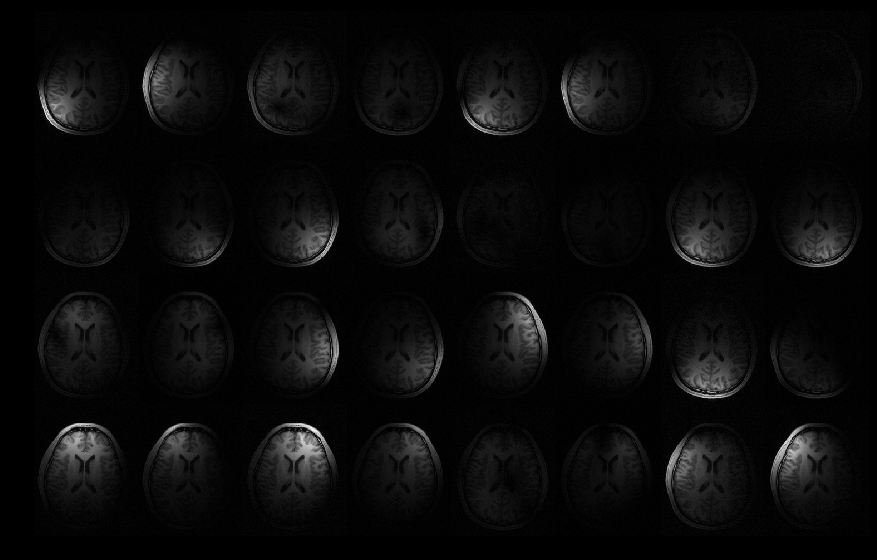

In [5]:
# Read the fully sampled image

dt2 = sio.loadmat('img_grappa_32chan.mat')
img_coils = dt2['IMG']

# Transpose to get the channel index in position 0, and rotate the image (if necessary)
img_coils = np.rot90(np.transpose(img_coils, (2,0,1)),k=-1,axes=(1,2))

# Crop the image (if necessary)
img_coils = img_coils[:,:,:]

# Get the dimensions
[num_chan, N1, N2] = img_coils.shape

# Visualize
print('Axis Labels: ' + '[num_chan, N1, N2]')
print('Image Shape: ' + str(img_coils.shape))
print('Data Type: ' + str(img_coils.dtype))

mosaic(img_coils, 4, 8, 1, [0,1], fig_size=(15,15), num_rot=0)

Axis Labels: [N1, N2]
Image Shape: (236, 188)
Data Type: float32


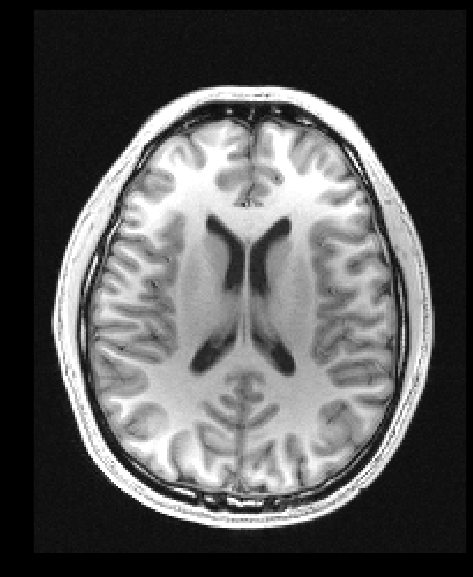

In [6]:
# Get the rssq image

image_original = np.sqrt(np.sum(np.square(np.abs(img_coils)),axis=0))

# Visualize
print('Axis Labels: ' + '[N1, N2]')
print('Image Shape: ' + str(image_original.shape))
print('Data Type: ' + str(image_original.dtype))

mosaic(image_original, 1, 1, 1, [0,1], fig_size=(10,10), num_rot=0)

## Set Acceleration Factor and ACS Size For All Reconstructions

In [7]:
# Note: The parity of each image dimension must match the parity of the corresponding acs dimension

num_acs = (30,N2)
Rx = 6

## Get the Fully Sampled K-space

Axis Labels: [num_chan, N1, N2]
Kspace Shape: (32, 236, 188)
Data Type: complex64


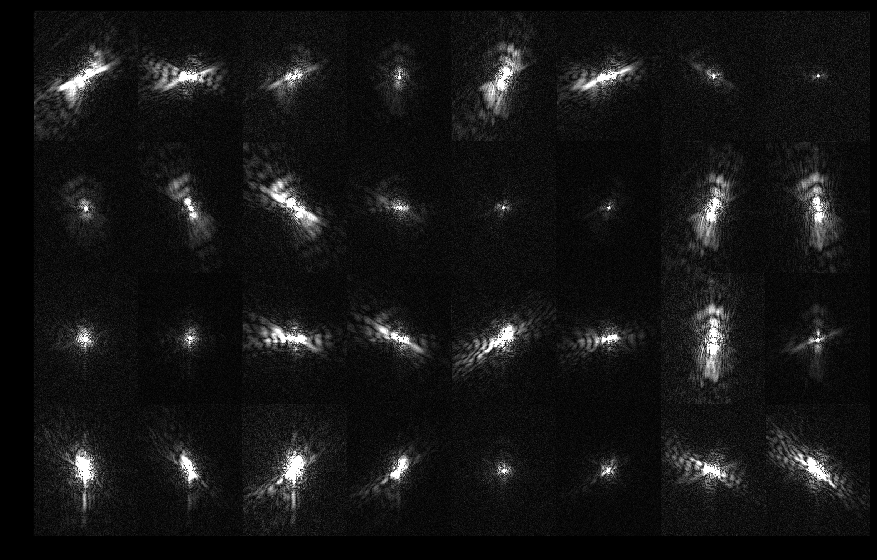

In [8]:
kspace_fully_sampled = np.fft.fftshift(np.fft.fft2(np.fft.ifftshift(img_coils, axes=(1,2)), axes=(1,2)), axes=(1,2))

# Visualize
print('Axis Labels: ' + '[num_chan, N1, N2]')
print('Kspace Shape: ' + str(kspace_fully_sampled.shape))
print('Data Type: ' + str(kspace_fully_sampled.dtype))

mosaic(kspace_fully_sampled[:,:,:], 4, 8, 1, [0,50], fig_size=(15,15), num_rot=0)

Axis Labels: [N1, N2]
Kspace Shape: (236, 188)
Kspace Type: float32


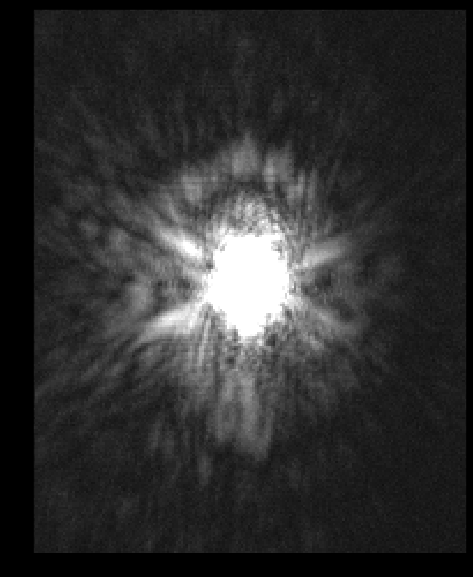

In [9]:
# Get the rssq kspace

kspace_original = np.sqrt(np.sum(np.square(np.abs(kspace_fully_sampled)),axis=0))

# Visualize
print('Axis Labels: ' + '[N1, N2]')
print('Kspace Shape: ' + str(kspace_original.shape))
print('Kspace Type: ' + str(kspace_original.dtype))

mosaic(kspace_original, 1, 1, 1, [0,150], fig_size=(10,10), num_rot=0)

## Get the ACS Data

Axis Labels: [num_chan, N1, N2]
kspace_acs_zero_filled Shape: (32, 236, 188)
kspace_acs_zero_filled Data Type: complex64

Axis Labels: [num_chan, N1, N2]
kspace_acs_cropped Shape: (32, 30, 188)
kspace_acs_cropped Data Type: complex64


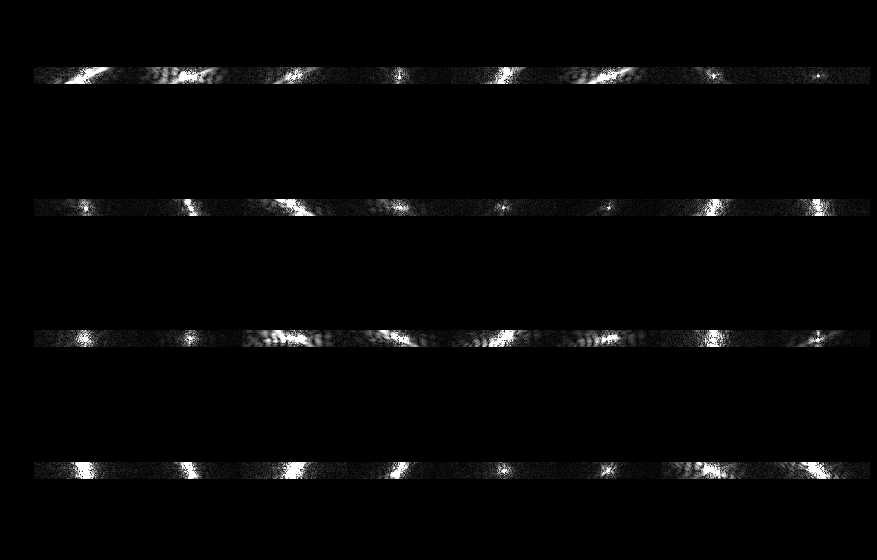

In [10]:
acs_start_index_x = N1//2 - num_acs[0]//2 # inclusive
acs_start_index_y = N2//2 - num_acs[1]//2 # inclusive
acs_end_index_x = np.int(np.ceil(N1/2)) + num_acs[0]//2 # exclusive
acs_end_index_y = np.int(np.ceil(N2/2)) + num_acs[1]//2 # exclusive
    
kspace_acs_zero_filled = np.zeros(kspace_fully_sampled.shape, dtype=kspace_fully_sampled.dtype)
kspace_acs_cropped = np.zeros([num_chan, num_acs[0], num_acs[1]], dtype=kspace_fully_sampled.dtype)

kspace_acs_zero_filled[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y] = kspace_fully_sampled[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y]
kspace_acs_cropped[:,:,:] = kspace_fully_sampled[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y]

# Visualize
print('Axis Labels: ' + '[num_chan, N1, N2]')
print('kspace_acs_zero_filled Shape: ' + str(kspace_acs_zero_filled.shape))
print('kspace_acs_zero_filled Data Type: ' + str(kspace_acs_zero_filled.dtype))
print()

# Visualize
print('Axis Labels: ' + '[num_chan, N1, N2]')
print('kspace_acs_cropped Shape: ' + str(kspace_acs_cropped.shape))
print('kspace_acs_cropped Data Type: ' + str(kspace_acs_cropped.dtype))

mosaic(kspace_acs_zero_filled, 4, 8, 1, [0,50], fig_size=(15,15), num_rot=0)

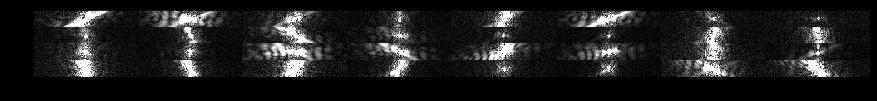

In [11]:
mosaic(kspace_acs_cropped, 4, 8, 1, [0,50], fig_size=(15,15), num_rot=0)

## Undersample

Axis Labels: [num_chan, N1, N2]
kspace_undersampled_zero_filled Shape: (32, 236, 188)
kspace_undersampled_zero_filled Data Type: complex64


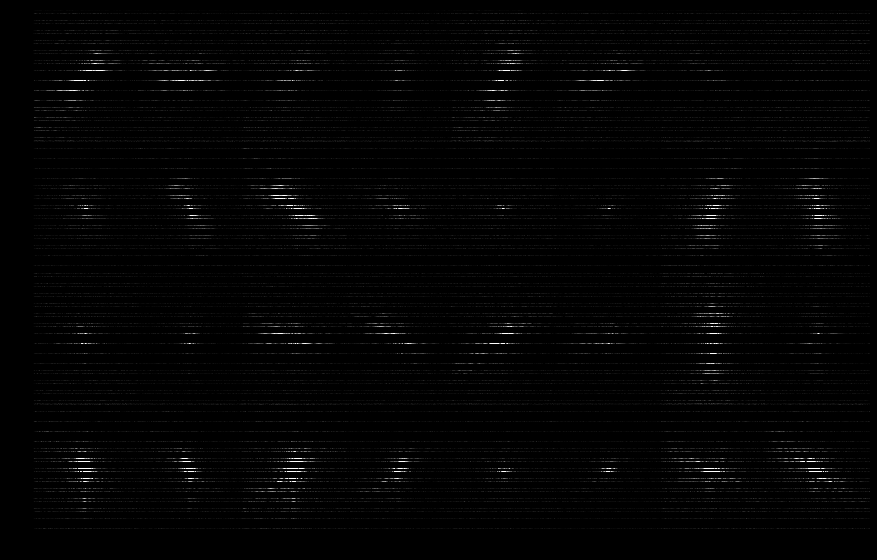

In [12]:
# Note: The sampling pattern might look incorrect because of aliasing while displaying the figure in smaller sizes. The data in the array itself is correct

kspace_undersampled_zero_filled = np.zeros(kspace_fully_sampled.shape, dtype=kspace_fully_sampled.dtype)
kspace_undersampled_zero_filled[:,0:N1:Rx,:] = kspace_fully_sampled[:,0:N1:Rx,:]

# Visualize
print('Axis Labels: ' + '[num_chan, N1, N2]')
print('kspace_undersampled_zero_filled Shape: ' + str(kspace_undersampled_zero_filled.shape))
print('kspace_undersampled_zero_filled Data Type: ' + str(kspace_undersampled_zero_filled.dtype))

mosaic(kspace_undersampled_zero_filled, 4, 8, 1, [0,50], fig_size=(15,15), num_rot=0)

# Recon Input Data Summary

In [13]:
print('Reconstruction Parameters')
print('---------------------------------------------')
print('Nx: ' + str(N1))
print('Ny: ' + str(N2))
print('ACS Size X: ' + str(num_acs[0]))
print('ACS Size Y: ' + str(num_acs[1]))
print('Rx: ' + str(Rx))
print()

print('ACS Data')
print('---------------------------------------------')
print('Axis Labels: ' + '[num_chan, N1, N2]')
print('kspace_acs_zero_filled Shape: ' + str(kspace_acs_zero_filled.shape))
print('kspace_acs_zero_filled Data Type: ' + str(kspace_acs_zero_filled.dtype))
print()
print('Axis Labels: ' + '[num_chan, N1, N2]')
print('kspace_acs_cropped Shape: ' + str(kspace_acs_cropped.shape))
print('kspace_acs_cropped Data Type: ' + str(kspace_acs_cropped.dtype))
print()

print('Sampled Data')
print('---------------------------------------------')
print('Axis Labels: ' + '[num_chan, N1, N2]')
print('kspace_undersampled_zero_filled Shape: ' + str(kspace_undersampled_zero_filled.shape))
print('kspace_undersampled_zero_filled Data Type: ' + str(kspace_undersampled_zero_filled.dtype))

Reconstruction Parameters
---------------------------------------------
Nx: 236
Ny: 188
ACS Size X: 30
ACS Size Y: 188
Rx: 6

ACS Data
---------------------------------------------
Axis Labels: [num_chan, N1, N2]
kspace_acs_zero_filled Shape: (32, 236, 188)
kspace_acs_zero_filled Data Type: complex64

Axis Labels: [num_chan, N1, N2]
kspace_acs_cropped Shape: (32, 30, 188)
kspace_acs_cropped Data Type: complex64

Sampled Data
---------------------------------------------
Axis Labels: [num_chan, N1, N2]
kspace_undersampled_zero_filled Shape: (32, 236, 188)
kspace_undersampled_zero_filled Data Type: complex64


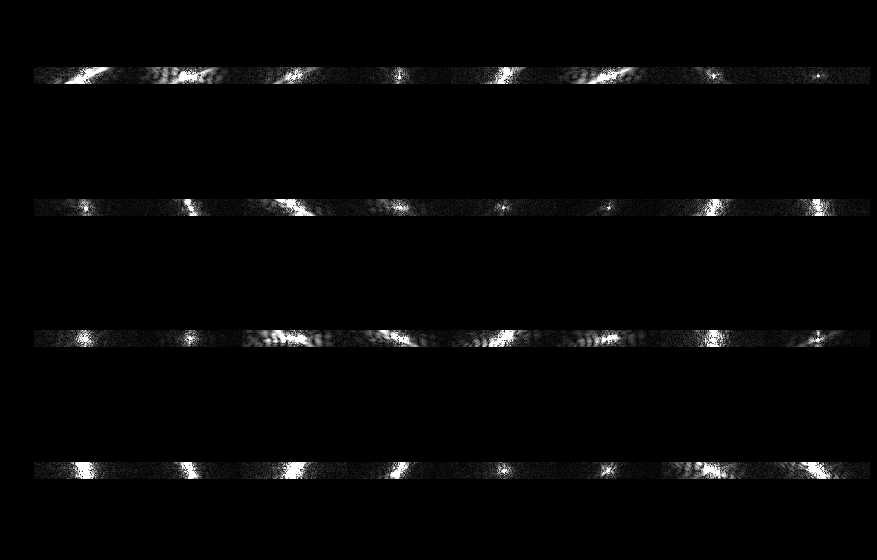

In [14]:
mosaic(kspace_acs_zero_filled, 4, 8, 1, [0,50], fig_size=(15,15), num_rot=0)

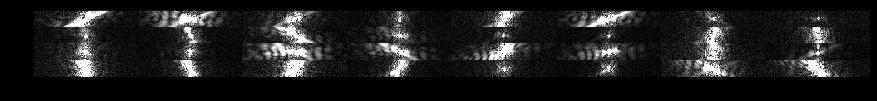

In [15]:
mosaic(kspace_acs_cropped, 4, 8, 1, [0,50], fig_size=(15,15), num_rot=0)

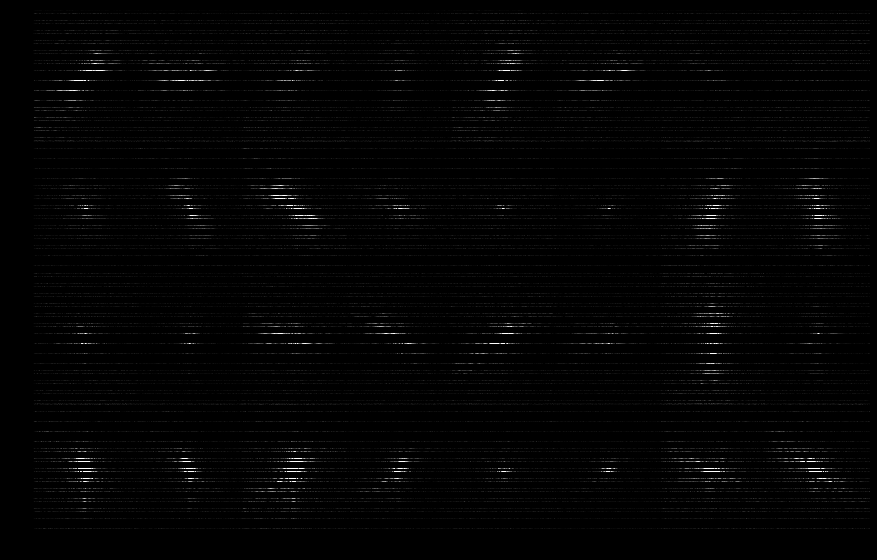

In [16]:
mosaic(kspace_undersampled_zero_filled, 4, 8, 1, [0,50], fig_size=(15,15), num_rot=0)

# GRAPPA

In [17]:
# Create coil sampling shifts (no shift in grappa)
grappa_shift_x = np.zeros(num_chan, dtype=int)
grappa_shift_y = np.zeros(num_chan, dtype=int)

In [ ]:
grappa_coil_images_without_sub = np.zeros(kspace_undersampled_zero_filled.shape, kspace_undersampled_zero_filled.dtype)
grappa_coil_kspaces_without_sub = np.zeros(kspace_undersampled_zero_filled.shape, dtype=kspace_undersampled_zero_filled.dtype)

grappa_coil_kspaces_without_sub, grappa_coil_images_without_sub = grappa(kspace_undersampled_zero_filled,kspace_acs_zero_filled, 
                                                                         Rx, 1, num_acs, grappa_shift_x, grappa_shift_y,kernel_size=np.array([3, 13]), lambda_tik=0)

Axis Labels: [num_coils, N1, N2]
GRAPPA Coil Images Shape: (32, 236, 188)
GRAPPA Coil Images Data Type: complex128

Axis Labels: [N1, N2]
GRAPPA RSSQ Image Shape: (236, 188)
GRAPPA RSSQ Image Data Type: float64

rmse_grappa: 0.10759319729484597

Original Image, Grappa Image


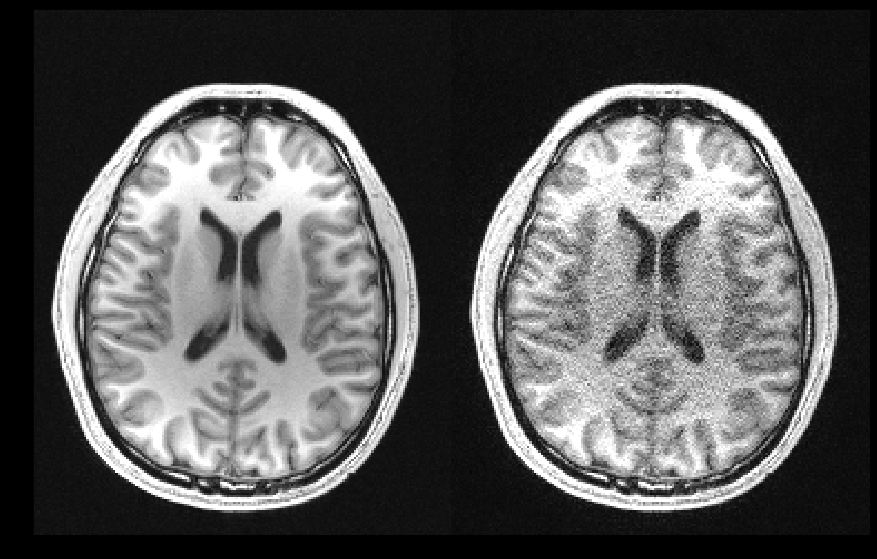

In [19]:
# Substitute ACS

acs_mask = np.zeros((num_chan, N1, N2), dtype=bool)
acs_mask[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y] = True

grappa_coil_kspaces_sub = (grappa_coil_kspaces_without_sub * np.invert(acs_mask).astype(int)) + kspace_acs_zero_filled[:,:,:]

grappa_coil_images_sub = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(grappa_coil_kspaces_sub, axes=(1,2)), axes=(1,2)), axes=(1,2))

# Visualize
print('Axis Labels: ' + '[num_coils, N1, N2]')
print('GRAPPA Coil Images Shape: ' + str(grappa_coil_images_sub.shape))
print('GRAPPA Coil Images Data Type: ' + str(grappa_coil_images_sub.dtype))
print()

grappa_rssq_image_sub = np.sqrt(np.sum(np.square(np.abs(grappa_coil_images_sub)),axis=0))

# Visualize
print('Axis Labels: ' + '[N1, N2]')
print('GRAPPA RSSQ Image Shape: ' + str(grappa_rssq_image_sub.shape))
print('GRAPPA RSSQ Image Data Type: ' + str(grappa_rssq_image_sub.dtype))
print()

comparison_grappa = np.concatenate((np.expand_dims(image_original, axis=0), np.expand_dims(grappa_rssq_image_sub, axis=0)), axis = 0)
rmse_grappa_sub = np.sqrt(np.sum(np.square(image_original - grappa_rssq_image_sub))) / np.sqrt(np.sum(np.square(image_original)))

print('rmse_grappa: ' + str(rmse_grappa_sub))
print()
print('Original Image, Grappa Image')
mosaic(comparison_grappa , 1, 2, 1, [0,1], fig_size=(15,15), num_rot=0)

# RAKI

In [20]:
##############################################################################################################
#########(The code in this section is directly copied from the code supplied with the original paper)#########
##############################################################################################################

## Reformat Input for RAKI

(188, 236, 32)


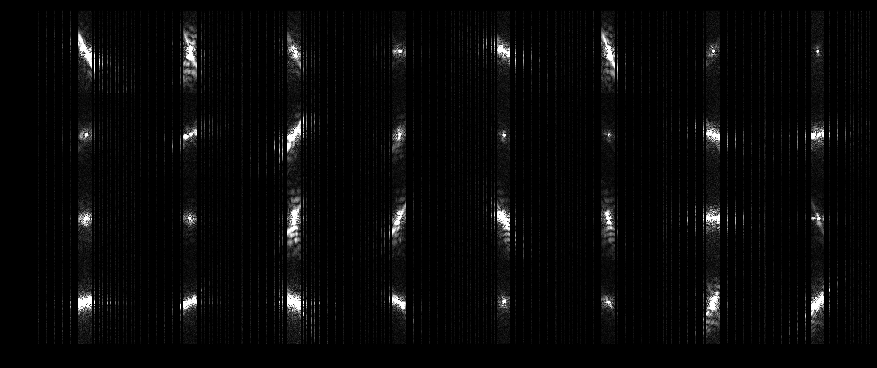

In [21]:
# Reformat input data to match the supplied RAKI code

acs_mask = np.zeros((num_chan, N1, N2), dtype=bool)
acs_mask[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y] = True

kspace = kspace_undersampled_zero_filled * np.invert(acs_mask).astype(int) + kspace_acs_zero_filled[:,:,:]
kspace = np.rot90(kspace,k=1,axes=(1,2))
mosaic(kspace, 4, 8, 1, [0,50], fig_size=(15,15), num_rot=0)

kspace = np.transpose(kspace,(1,2,0))
print(kspace.shape)

dt = {'kspace' : kspace}
sio.savemat('rawdata', dt)

## Utils

In [22]:
def weight_variable(shape,vari_name):                   
    initial = tf.truncated_normal(shape, stddev=0.1,dtype=tf.float32)
    return tf.Variable(initial,name = vari_name)

def bias_variable(shape):
    initial = tf.constant(0.1, shape=shape,dtype=tf.float32)
    return tf.Variable(initial)

def conv2d(x, W):
    return tf.nn.conv2d(x, W, strides=[1, 1, 1, 1], padding='VALID')

def conv2d_dilate(x, W,dilate_rate):
    return tf.nn.convolution(x, W,padding='VALID',dilation_rate = [1,dilate_rate])

#### LEARNING FUNCTION ####
def learning(ACS_input,target_input,accrate_input,sess):
    
    input_ACS = tf.placeholder(tf.float32, [1, ACS_dim_X,ACS_dim_Y,ACS_dim_Z])                                  
    input_Target = tf.placeholder(tf.float32, [1, target_dim_X,target_dim_Y,target_dim_Z])         
    
    Input = tf.reshape(input_ACS, [1, ACS_dim_X, ACS_dim_Y, ACS_dim_Z])         

    [target_dim0,target_dim1,target_dim2,target_dim3] = np.shape(target)

    W_conv1 = weight_variable([kernel_x_1, kernel_y_1, ACS_dim_Z, layer1_channels],'W1') 
    h_conv1 = tf.nn.relu(conv2d_dilate(Input, W_conv1,accrate_input)) 

    W_conv2 = weight_variable([kernel_x_2, kernel_y_2, layer1_channels, layer2_channels],'W2')
    h_conv2 = tf.nn.relu(conv2d_dilate(h_conv1, W_conv2,accrate_input))

    W_conv3 = weight_variable([kernel_last_x, kernel_last_y, layer2_channels, target_dim3],'W3')
    h_conv3 = conv2d_dilate(h_conv2, W_conv3,accrate_input)

    error_norm = tf.norm(input_Target - h_conv3)       
    train_step = tf.train.AdamOptimizer(LearningRate).minimize(error_norm)

    if int((tf.__version__).split('.')[1]) < 12 and int((tf.__version__).split('.')[0]) < 1:
        init = tf.initialize_all_variables()
    else:
        init = tf.global_variables_initializer()
    sess.run(init)

    error_prev = 1 
    for i in range(MaxIteration+1):
        
        sess.run(train_step, feed_dict={input_ACS: ACS, input_Target: target})
        if i % 100 == 0:                                                                      
            error_now=sess.run(error_norm,feed_dict={input_ACS: ACS, input_Target: target})    
            print('The',i,'th iteration gives an error',error_now)                             
            
            
        
    error = sess.run(error_norm,feed_dict={input_ACS: ACS, input_Target: target})
    return [sess.run(W_conv1),sess.run(W_conv2),sess.run(W_conv3),error]  


def cnn_3layer(input_kspace,w1,b1,w2,b2,w3,b3,acc_rate,sess):                
    h_conv1 = tf.nn.relu(conv2d_dilate(input_kspace, w1,acc_rate)) 
    h_conv2 = tf.nn.relu(conv2d_dilate(h_conv1, w2,acc_rate))
    h_conv3 = conv2d_dilate(h_conv2, w3,acc_rate) 
    return sess.run(h_conv3)      

## Parse Data

In [23]:
#######################################################################
###                                                                 ###
### For convinience, everything are the same with Matlab version :) ###
###                                                                 ###
#######################################################################

###################### Reconstruction Parameters ######################

#### Network Parameters ####
kernel_x_1 = 5
kernel_y_1 = 2

kernel_x_2 = 1
kernel_y_2 = 1

kernel_last_x = 3
kernel_last_y = 2

layer1_channels = 32 
layer2_channels = 8

MaxIteration = 1000
LearningRate = 3e-3

#### Input/Output Data ####
inputData = 'rawdata.mat'
input_variable_name = 'kspace'
resultName = 'RAKI_recon'
recon_variable_name = 'kspace_recon'

######################################################################

# Read data
kspace = sio.loadmat(inputData)
kspace = kspace[input_variable_name] 
no_ACS_flag = 0;

# Normalization
normalize = 0.015/np.max(abs(kspace[:]))
kspace = np.multiply(kspace,normalize)   

# Get the shapes
[m1,n1,no_ch] = np.shape(kspace)
no_inds = 1

kspace_all = kspace;

In [24]:
# Kspace grid
kx = np.transpose(np.int32([(range(1,m1+1))]))                  
ky = np.int32([(range(1,n1+1))])

In [25]:
# Mask on ky
kspace = np.copy(kspace_all)
mask = np.squeeze(np.matlib.sum(np.matlib.sum(np.abs(kspace),0),1))>0; 
picks = np.where(mask == 1); 

# Cut the leftmost zero entries in kspace?
kspace = kspace[:,np.int32(picks[0][0]):n1+1,:] # n1+1 is out of index by 1
kspace_all = kspace_all[:,np.int32(picks[0][0]):n1+1,:]

In [26]:
# Determine ACS Indices
kspace_NEVER_TOUCH = np.copy(kspace_all)

mask = np.squeeze(np.matlib.sum(np.matlib.sum(np.abs(kspace),0),1))>0;  
picks = np.where(mask == 1);                                  
d_picks = np.diff(picks,1)  
indic = np.where(d_picks == 1);

In [27]:
# Get x indices where there is data
mask_x = np.squeeze(np.matlib.sum(np.matlib.sum(np.abs(kspace),2),1))>0;
picks_x = np.where(mask_x == 1);
x_start = picks_x[0][0]
x_end = picks_x[0][-1]

In [28]:
# Parse the ACS

if np.size(indic)==0:    
    no_ACS_flag=1;       
    print('No ACS signal in input data, using individual ACS file.')
    matfn = 'ACS.mat'   
    ACS = sio.loadmat(matfn)
    ACS = ACS['ACS']     
    normalize = 0.015/np.max(abs(ACS[:])) 
    ACS = np.multiply(ACS,normalize*scaling) # There is no variable declaration for scaling?!

    kspace = np.multiply(kspace,scaling)
    [ACS_dim_X, ACS_dim_Y, ACS_dim_Z] = np.shape(ACS)
    ACS_re = np.zeros([ACS_dim_X,ACS_dim_Y,ACS_dim_Z*2])
    ACS_re[:,:,0:no_ch] = np.real(ACS)
    ACS_re[:,:,no_ch:no_ch*2] = np.imag(ACS)
else:
    no_ACS_flag=0;
    print('ACS signal found in the input data')
    indic = indic[1][:]
    center_start = picks[0][indic[0]];
    center_end = picks[0][indic[-1]+1]; # There is an indexing mistake here; center_end = picks[0][indic[-1]]
    ACS = kspace[x_start:x_end+1,center_start:center_end+1,:]
    [ACS_dim_X, ACS_dim_Y, ACS_dim_Z] = np.shape(ACS)
    ACS_re = np.zeros([ACS_dim_X,ACS_dim_Y,ACS_dim_Z*2])
    ACS_re[:,:,0:no_ch] = np.real(ACS)
    ACS_re[:,:,no_ch:no_ch*2] = np.imag(ACS)

ACS signal found in the input data


In [29]:
# Get the acceleration rate

acc_rate = d_picks[0][0]
no_channels = ACS_dim_Z*2

In [30]:
# Pre-allocation

name_weight = resultName + ('_weight_%d%d,%d%d,%d%d_%d,%d.mat' % (kernel_x_1,kernel_y_1,kernel_x_2,kernel_y_2,kernel_last_x,kernel_last_y,layer1_channels,layer2_channels))
name_image = resultName + ('_image_%d%d,%d%d,%d%d_%d,%d.mat' % (kernel_x_1,kernel_y_1,kernel_x_2,kernel_y_2,kernel_last_x,kernel_last_y,layer1_channels,layer2_channels))

existFlag = os.path.isfile(name_image)

w1_all = np.zeros([kernel_x_1, kernel_y_1, no_channels, layer1_channels, no_channels],dtype=np.float32)
w2_all = np.zeros([kernel_x_2, kernel_y_2, layer1_channels,layer2_channels,no_channels],dtype=np.float32)
w3_all = np.zeros([kernel_last_x, kernel_last_y, layer2_channels,acc_rate - 1, no_channels],dtype=np.float32)    

# What the !?
b1_flag = 0;
b2_flag = 0;                       
b3_flag = 0;

if (b1_flag == 1):
    b1_all = np.zeros([1,1, layer1_channels,no_channels]);
else:
    b1 = []

if (b2_flag == 1):
    b2_all = np.zeros([1,1, layer2_channels,no_channels])
else:
    b2 = []

if (b3_flag == 1):
    b3_all = np.zeros([1,1, layer3_channels, no_channels])
else:
    b3 = []

In [31]:
# ACS limits so that all kernels stay in the ACS region

target_x_start = np.int32(np.ceil(kernel_x_1/2) + np.floor(kernel_x_2/2) + np.floor(kernel_last_x/2) -1); 
target_x_end = np.int32(ACS_dim_X - target_x_start -1); 

time_ALL_start = time.time()

[ACS_dim_X, ACS_dim_Y, ACS_dim_Z] = np.shape(ACS_re)
ACS = np.reshape(ACS_re, [1,ACS_dim_X, ACS_dim_Y, ACS_dim_Z]) 
ACS = np.float32(ACS)  

target_y_start = np.int32((np.ceil(kernel_y_1/2)-1) + (np.ceil(kernel_y_2/2)-1) + (np.ceil(kernel_last_y/2)-1)) * acc_rate;     
target_y_end = ACS_dim_Y  - np.int32((np.floor(kernel_y_1/2) + np.floor(kernel_y_2/2) + np.floor(kernel_last_y/2))) * acc_rate -1;

target_dim_X = target_x_end - target_x_start + 1
target_dim_Y = target_y_end - target_y_start + 1
target_dim_Z = acc_rate - 1

## Training

In [ ]:
print('go!')
time_Learn_start = time.time() 

errorSum = 0;
config = tf.ConfigProto()


for ind_c in range(ACS_dim_Z):

    sess = tf.Session(config=config)
    # set target lines
    target = np.zeros([1,target_dim_X,target_dim_Y,target_dim_Z])
    print('learning channel #',ind_c+1)
    time_channel_start = time.time()
    
    for ind_acc in range(acc_rate-1):
        target_y_start = np.int32((np.ceil(kernel_y_1/2)-1) + (np.ceil(kernel_y_2/2)-1) + (np.ceil(kernel_last_y/2)-1)) * acc_rate + ind_acc + 1 
        target_y_end = ACS_dim_Y  - np.int32((np.floor(kernel_y_1/2) + (np.floor(kernel_y_2/2)) + np.floor(kernel_last_y/2))) * acc_rate + ind_acc
        target[0,:,:,ind_acc] = ACS[0,target_x_start:target_x_end + 1, target_y_start:target_y_end +1,ind_c];

    # learning

    [w1,w2,w3,error]=learning(ACS,target,acc_rate,sess) 
    w1_all[:,:,:,:,ind_c] = w1
    w2_all[:,:,:,:,ind_c] = w2
    w3_all[:,:,:,:,ind_c] = w3                               
    time_channel_end = time.time()
    print('Time Cost:',time_channel_end-time_channel_start,'s')
    print('Norm of Error = ',error)
    errorSum = errorSum + error

    sess.close()
    tf.reset_default_graph()
    
time_Learn_end = time.time();
print('lerning step costs:',(time_Learn_end - time_Learn_start)/60,'min')
sio.savemat(name_weight, {'w1': w1_all,'w2': w2_all,'w3': w3_all})  

## Reconstruction

In [33]:
kspace_recon_all = np.copy(kspace_all)
kspace_recon_all_nocenter = np.copy(kspace_all)

kspace = np.copy(kspace_all)

# Find oversampled lines and set them to zero
over_samp = np.setdiff1d(picks,np.int32([range(0, n1,acc_rate)]))
kspace_und = kspace
kspace_und[:,over_samp,:] = 0;
[dim_kspaceUnd_X,dim_kspaceUnd_Y,dim_kspaceUnd_Z] = np.shape(kspace_und)

# Split real and imaginary parts
kspace_und_re = np.zeros([dim_kspaceUnd_X,dim_kspaceUnd_Y,dim_kspaceUnd_Z*2])
kspace_und_re[:,:,0:dim_kspaceUnd_Z] = np.real(kspace_und)
kspace_und_re[:,:,dim_kspaceUnd_Z:dim_kspaceUnd_Z*2] = np.imag(kspace_und)
kspace_und_re = np.float32(kspace_und_re)
kspace_und_re = np.reshape(kspace_und_re,[1,dim_kspaceUnd_X,dim_kspaceUnd_Y,dim_kspaceUnd_Z*2])
kspace_recon = kspace_und_re

In [ ]:
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 1/3 ; 

for ind_c in range(0,no_channels):
    print('Reconstruting Channel #',ind_c+1)
    
    sess = tf.Session(config=config) 
    if int((tf.__version__).split('.')[1]) < 12 and int((tf.__version__).split('.')[0]) < 1:
        init = tf.initialize_all_variables()
    else:
        init = tf.global_variables_initializer()
    sess.run(init)
    
    # grab w and b
    w1 = np.float32(w1_all[:,:,:,:,ind_c])
    w2 = np.float32(w2_all[:,:,:,:,ind_c])     
    w3 = np.float32(w3_all[:,:,:,:,ind_c])

    if (b1_flag == 1):
        b1 = b1_all[:,:,:,ind_c];
    if (b2_flag == 1):
        b2 = b2_all[:,:,:,ind_c];
    if (b3_flag == 1):
        b3 = b3_all[:,:,:,ind_c];                
        
    res = cnn_3layer(kspace_und_re,w1,b1,w2,b2,w3,b3,acc_rate,sess) 
    target_x_end_kspace = dim_kspaceUnd_X - target_x_start;
    
    for ind_acc in range(0,acc_rate-1):

        target_y_start = np.int32((np.ceil(kernel_y_1/2)-1) + np.int32((np.ceil(kernel_y_2/2)-1)) + np.int32(np.ceil(kernel_last_y/2)-1)) * acc_rate + ind_acc + 1;             
        target_y_end_kspace = dim_kspaceUnd_Y - np.int32((np.floor(kernel_y_1/2)) + (np.floor(kernel_y_2/2)) + np.floor(kernel_last_y/2)) * acc_rate + ind_acc;
        kspace_recon[0,target_x_start:target_x_end_kspace,target_y_start:target_y_end_kspace+1:acc_rate,ind_c] = res[0,:,::acc_rate,ind_acc]

    sess.close()
    tf.reset_default_graph()
    
kspace_recon = np.squeeze(kspace_recon)

kspace_recon_complex = (kspace_recon[:,:,0:np.int32(no_channels/2)] + np.multiply(kspace_recon[:,:,np.int32(no_channels/2):no_channels],1j))
kspace_recon_all_nocenter[:,:,:] = np.copy(kspace_recon_complex); 


if no_ACS_flag == 0: 
    kspace_recon_complex[:,center_start:center_end,:] = kspace_NEVER_TOUCH[:,center_start:center_end,:]
    print('ACS signal has been putted back')
else:
    print('No ACS signal is putted into k-space')

kspace_recon_all[:,:,:] = kspace_recon_complex; 

for sli in range(0,no_ch):
    kspace_recon_all[:,:,sli] = np.fft.ifft2(kspace_recon_all[:,:,sli])

rssq = (np.sum(np.abs(kspace_recon_all)**2,2)**(0.5))
sio.savemat(name_image,{recon_variable_name:kspace_recon_complex})

time_ALL_end = time.time()
print('All process costs ',(time_ALL_end-time_ALL_start)/60,'mins')
print('Error Average in Training is ',errorSum/no_channels)

## Results

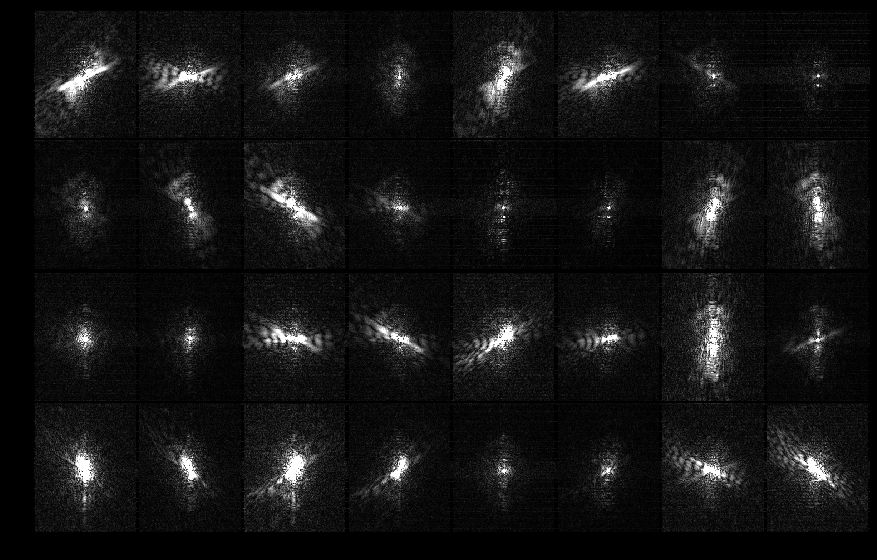

In [35]:
# Read the kspace
dt = sio.loadmat('RAKI_recon_image_52,11,32_32,8.mat')

kspace_recon = dt['kspace_recon']
kspace_recon = np.transpose(kspace_recon,(2,0,1))
kspace_recon = np.rot90(kspace_recon,k=-1,axes=(1,2))
kspace_recon = kspace_recon/normalize

mosaic(kspace_recon, 4, 8, 1, [0,50], fig_size=(15,15), num_rot=0)

Axis Labels: [num_coils, N1, N2]
RAKI Coil Images Shape: (32, 236, 188)
RAKI Coil Images Data Type: complex64
rmse_raki: 0.08682374

Original Image, Rakı Image


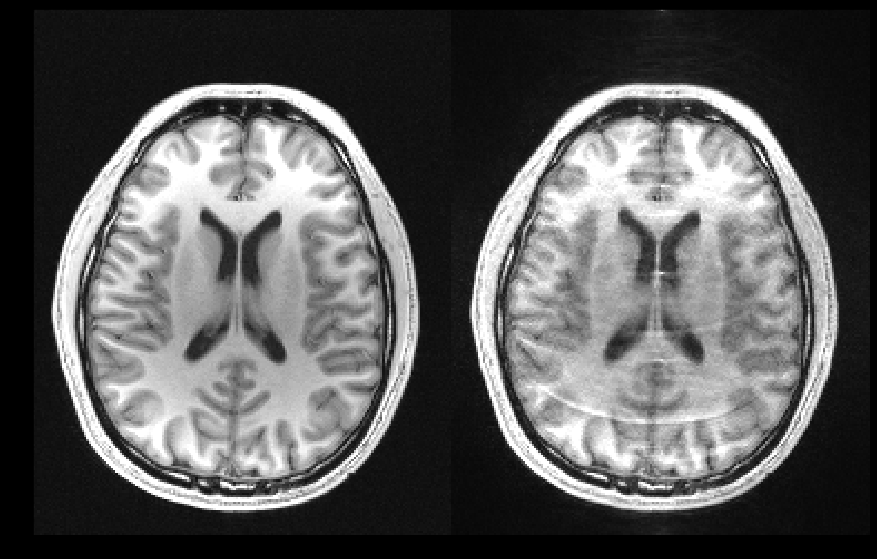

In [36]:
# Get the RAKI coil images
coil_images_raki_sub = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(kspace_recon, axes=(1,2)), axes=(1,2)), axes=(1,2))

# Visualize
print('Axis Labels: ' + '[num_coils, N1, N2]')
print('RAKI Coil Images Shape: ' + str(coil_images_raki_sub.shape))
print('RAKI Coil Images Data Type: ' + str(coil_images_raki_sub.dtype))

raki_rssq_image_sub = np.sqrt(np.sum(np.square(np.abs(coil_images_raki_sub)),axis=0))

comparison_raki = np.concatenate((np.expand_dims(image_original, axis=0), np.expand_dims(raki_rssq_image_sub, axis=0)), axis = 0)
rmse_raki_sub = np.sqrt(np.sum(np.square(np.abs(image_original - raki_rssq_image_sub)))) / np.sqrt(np.sum(np.square(np.abs(image_original))))

print('rmse_raki: ' + str(rmse_raki_sub))
print()
print('Original Image, Rakı Image')
mosaic(comparison_raki , 1, 2, 1, [0,1], fig_size=(15,15), num_rot=0)

# SPARK with GRAPPA

## Iteration 1

### Initial Reconstruction using GRAPPA

In [ ]:
grappa_coil_images_without_sub = np.zeros(kspace_undersampled_zero_filled.shape, kspace_undersampled_zero_filled.dtype)
grappa_coil_kspaces_without_sub = np.zeros(kspace_undersampled_zero_filled.shape, dtype=kspace_undersampled_zero_filled.dtype)

grappa_coil_kspaces_without_sub, grappa_coil_images_without_sub = grappa(kspace_undersampled_zero_filled,kspace_acs_zero_filled, 
                                                                         Rx, 1, num_acs, grappa_shift_x, grappa_shift_y,kernel_size=np.array([3, 13]), lambda_tik=0)

Axis Labels: [num_coils, N1, N2]
GRAPPA Coil Images Shape: (32, 236, 188)
GRAPPA Coil Images Data Type: complex128

Axis Labels: [N1, N2]
GRAPPA RSSQ Image Shape: (236, 188)
GRAPPA RSSQ Image Data Type: float64

rmse_grappa: 0.10759319729484597

Original Image, GRAPPA Image


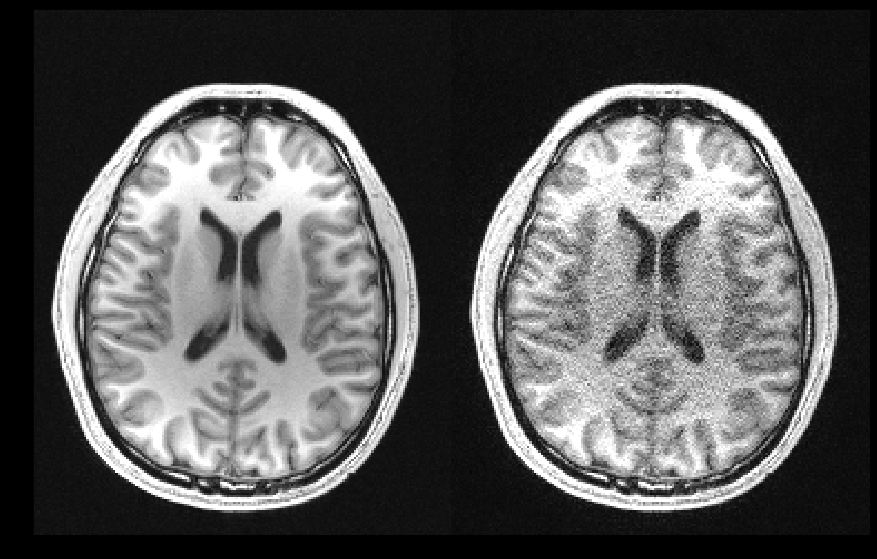

In [38]:
# Substitute ACS

acs_mask = np.zeros((num_chan, N1, N2), dtype=bool)
acs_mask[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y] = True

grappa_coil_kspaces_sub = (grappa_coil_kspaces_without_sub * np.invert(acs_mask).astype(int)) + kspace_acs_zero_filled[:,:,:]

grappa_coil_images_sub = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(grappa_coil_kspaces_sub, axes=(1,2)), axes=(1,2)), axes=(1,2))

# Visualize
print('Axis Labels: ' + '[num_coils, N1, N2]')
print('GRAPPA Coil Images Shape: ' + str(grappa_coil_images_sub.shape))
print('GRAPPA Coil Images Data Type: ' + str(grappa_coil_images_sub.dtype))
print()

grappa_rssq_image_sub = np.sqrt(np.sum(np.square(np.abs(grappa_coil_images_sub)),axis=0))

# Visualize
print('Axis Labels: ' + '[N1, N2]')
print('GRAPPA RSSQ Image Shape: ' + str(grappa_rssq_image_sub.shape))
print('GRAPPA RSSQ Image Data Type: ' + str(grappa_rssq_image_sub.dtype))
print()

comparison_grappa = np.concatenate((np.expand_dims(image_original, axis=0), np.expand_dims(grappa_rssq_image_sub, axis=0)), axis = 0)
rmse_grappa_sub = np.sqrt(np.sum(np.square(image_original - grappa_rssq_image_sub))) / np.sqrt(np.sum(np.square(image_original)))

print('rmse_grappa: ' + str(rmse_grappa_sub))
print()
print('Original Image, GRAPPA Image')
mosaic(comparison_grappa , 1, 2, 1, [0,1], fig_size=(15,15), num_rot=0)

Original Kspace, Grappa Kspace


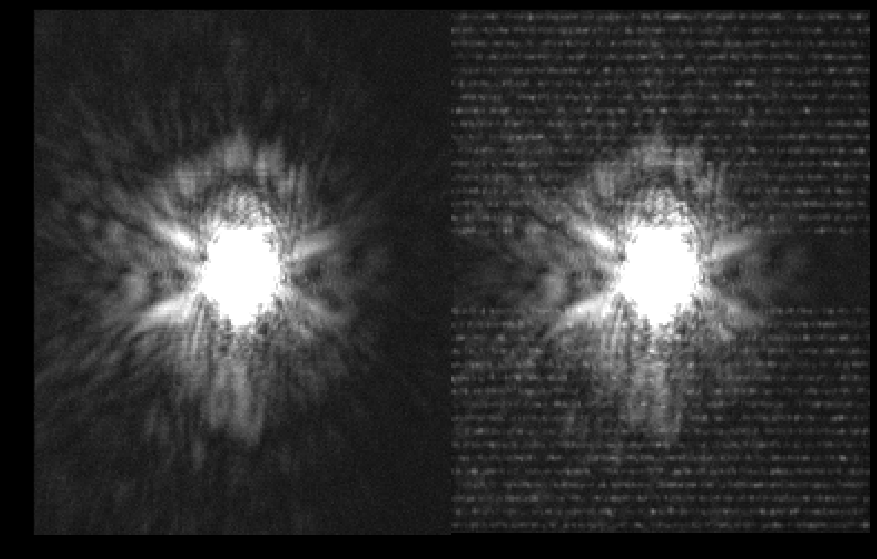

In [39]:
# Get the rssq GRAPPA kspace

kspace_grappa_rssq = np.sqrt(np.sum(np.square(np.abs(grappa_coil_kspaces_sub)),axis=0))
comparison_grappa_kspace = np.concatenate((np.expand_dims(kspace_original, axis=0), np.expand_dims(kspace_grappa_rssq, axis=0)), axis = 0)

print('Original Kspace, Grappa Kspace')
mosaic(comparison_grappa_kspace , 1, 2, 1, [0,150], fig_size=(15,15), num_rot=0)

### Kspace Artifact Reduction Using SPARK

#### Get the ACS Difference

In [40]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Axis Labels: [num_coils, N1, N2]
acs_difference Shape: (32, 30, 188)
acs_difference Data Type: complex64


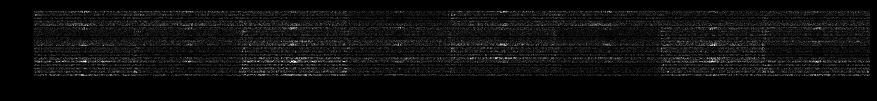

In [41]:
# Get the ACS Difference

acs_grappa = np.zeros([num_chan, num_acs[0], num_acs[1]], dtype=grappa_coil_kspaces_without_sub.dtype)
acs_grappa[:,:,:] = grappa_coil_kspaces_without_sub[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y]

acs_difference = kspace_acs_cropped - acs_grappa

# Visualize
print('Axis Labels: ' + '[num_coils, N1, N2]')
print('acs_difference Shape: ' + str(acs_difference.shape))
print('acs_difference Data Type: ' + str(acs_difference.dtype))

mosaic(acs_difference, 4, 8, 1, [0,30], fig_size=(15,15), num_rot=0)

#### Split Real and Imaginary Parts

In [42]:
# Split Real and Imaginary Parts

acs_difference_real = np.real(acs_difference)
acs_difference_imag = np.imag(acs_difference)

print('acs_difference_real shape: ' + str(acs_difference_real.shape))
print('acs_difference_imag shape: ' + str(acs_difference_imag.shape))

# Add the batch dimension
kspace_grappa = np.expand_dims(grappa_coil_kspaces_without_sub,axis=0)
kspace_grappa_real = np.real(kspace_grappa)
kspace_grappa_imag = np.imag(kspace_grappa)
kspace_grappa_split = np.concatenate((kspace_grappa_real, kspace_grappa_imag), axis=1)

print('kspace_grappa_split shape: ' + str(kspace_grappa_split.shape))

acs_difference_real shape: (32, 30, 188)
acs_difference_imag shape: (32, 30, 188)
kspace_grappa_split shape: (1, 64, 236, 188)


#### Normalize

In [43]:
print('kspace_grappa_split max: ' + str(np.amax(np.abs(kspace_grappa_split))))
print('acs_difference_real max: ' + str(np.amax(np.abs(acs_difference_real))))
print('acs_difference_imag  max: ' + str(np.amax(np.abs(acs_difference_imag))))

kspace_grappa_split max: 2977.1882
acs_difference_real max: 36.008743
acs_difference_imag  max: 37.415634


In [44]:
# Normalize
scale_factor_input = 1/np.amax(np.abs(kspace_grappa_split))
kspace_grappa_split *= scale_factor_input

In [ ]:
chan_scale_factors_real = []
chan_scale_factors_imag = []

for chan in range(num_chan):
    scale_factor_real = 1/np.amax(np.abs(acs_difference_real[chan,:,:]))
    scale_factor_imag = 1/np.amax(np.abs(acs_difference_imag[chan,:,:]))
    
    chan_scale_factors_real.append(scale_factor_real)
    chan_scale_factors_imag.append(scale_factor_imag)
    
    acs_difference_real[chan,:,:] = acs_difference_real[chan,:,:] * scale_factor_real
    acs_difference_imag[chan,:,:] = acs_difference_imag[chan,:,:] * scale_factor_imag
    
print('kspace_grappa_split max: ' + str(np.amax(np.abs(kspace_grappa_split))))

for chan in range(num_chan):
    print('acs_difference_real_chan' + str(chan+1) + ' max: ' + str(np.amax(np.abs(acs_difference_real[chan,:,:]))))
    print('acs_difference_imag_chan' + str(chan+1) + ' max: ' + str(np.amax(np.abs(acs_difference_imag[chan,:,:]))))

#### Add Batch/Color Dimensions and Pass Data to GPU

In [46]:
acs_difference_real = np.expand_dims(acs_difference_real, axis=1)
acs_difference_real = np.expand_dims(acs_difference_real, axis=1)
acs_difference_imag = np.expand_dims(acs_difference_imag, axis=1)
acs_difference_imag = np.expand_dims(acs_difference_imag, axis=1)

print('acs_difference_real shape: ' + str(acs_difference_real.shape))
print('acs_difference_imag shape: ' + str(acs_difference_imag.shape))

acs_difference_real shape: (32, 1, 1, 30, 188)
acs_difference_imag shape: (32, 1, 1, 30, 188)


In [ ]:
# Print GPU Info

print("PYTORCH:")
print("---------------------------------------------------------")

print('GPU Available: ' + str(torch.cuda.is_available()))
print('Current Device: ' + str(torch.cuda.current_device()))
print('Number of GPU\'s available: ' + str(torch.cuda.device_count()))

gpu_num = torch.cuda.device_count()
for i in range(0, gpu_num):
    print('GPU found: ' + str(torch.cuda.device(0)))
    print('GPU:%d ' % i + str(torch.cuda.get_device_name(i)))

print("---------------------------------------------------------")   

print("NVIDIA:")
for gpu in iter(nvgpu.gpu_info()):
    print("---------------------------------------------------------")
    for name, value in gpu.items():
        print(str(name) + ': ' + str(value))

print("---------------------------------------------------------")    

In [48]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

kspace_grappa_split = torch.from_numpy(kspace_grappa_split)
kspace_grappa_split = kspace_grappa_split.to(device, dtype=torch.float)
print('kspace_grappa_split shape: ' + str(kspace_grappa_split.shape))

acs_difference_real = torch.from_numpy(acs_difference_real)
acs_difference_real = acs_difference_real.to(device, dtype=torch.float)
print('acs_difference_real shape: ' + str(acs_difference_real.shape))

acs_difference_imag = torch.from_numpy(acs_difference_imag)
acs_difference_imag = acs_difference_imag.to(device, dtype=torch.float)
print('acs_target_imag shape: ' + str(acs_difference_imag.shape))

kspace_grappa_split shape: torch.Size([1, 64, 236, 188])
acs_difference_real shape: torch.Size([32, 1, 1, 30, 188])
acs_target_imag shape: torch.Size([32, 1, 1, 30, 188])


#### Define and Train Networks

In [49]:
class SPARK_Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(num_chan*2, 64, 3, padding=1, bias=False)
        self.conv2 = nn.Conv2d(64, 32, 1, padding=0, bias=False)
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1, bias=False)
        self.conv4 = nn.Conv2d(64, 32, 3, padding=1, bias=False)
        self.conv5 = nn.Conv2d(32, 8, 1, padding=0, bias=False)
        self.conv6 = nn.Conv2d(8, 1, 3, padding=1, bias=False)
        
    def forward(self, x):
        y = F.relu(self.conv1(x))
        y = F.relu(self.conv2(y))
        y = F.relu(self.conv3(y))
        z = x + y
        z = F.relu(self.conv4(z))
        z = F.relu(self.conv5(z))
        out = self.conv6(z)
        
        loss_out = out[:,:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y]
        
        return out, loss_out

In [50]:
net = SPARK_Net()
net.to(device)

SPARK_Net(
  (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv2): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv4): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv5): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv6): Conv2d(8, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
)

SPARK_Net(
  (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv2): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv4): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv5): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv6): Conv2d(8, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 236, 188]          36,864
            Conv2d-2         [-1, 32, 236, 188]           2,048
            Conv2d-3         [-1, 64, 236, 188]          18,432
            Conv2d-4         [-1, 32, 236, 188]          18,432
            Conv2d-5          [-1, 8, 236, 188]             256
            Conv2d-6          [-1, 1, 2

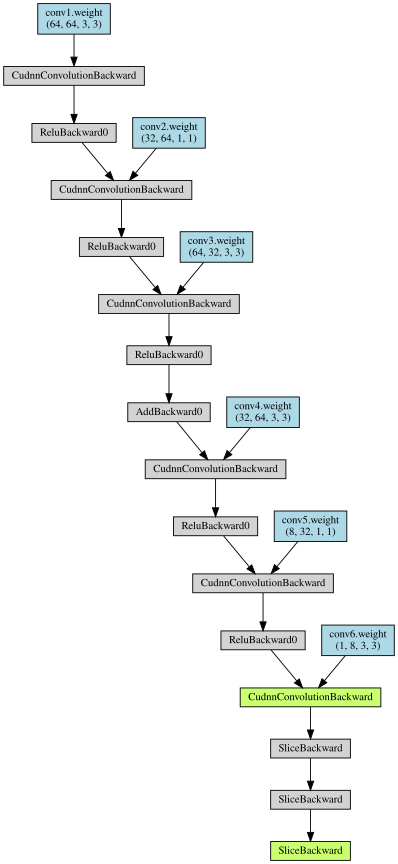

In [51]:
## Visualization Block

input_size = kspace_grappa_split.shape[1:4]
input_size_batch = kspace_grappa_split.shape
#Summary
print(net)
summary(net, input_size)
#Layer parameters
net_named_params = dict(net.named_parameters()) #parameters with name and grad
for name, parameter in net_named_params.items():
    print(name + ':')
    print(parameter.shape)
    #print(parameter)
print('\n')   
#Visualization
net_test_in = torch.randn(input_size_batch).to("cuda")
net_test_out = net(net_test_in)
print('Input Shape: ' + str(net_test_in.shape))
print('Output1 Shape: ' + str(net_test_out[0].shape))
print('Output2 Shape: ' + str(net_test_out[1].shape))
make_dot(net_test_out,params=dict(net.named_parameters()))

In [52]:
criterion = nn.MSELoss()
num_iter = 250

In [ ]:
# Train real models
real_models = {}
real_model_names = []

for model_num in range(0,num_chan):
    
    model_name = 'model' + str(model_num) + 'r'
    model = SPARK_Net()
    model.to(device)
    
    warnings.filterwarnings('ignore')
    
    print()
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print(r'___________             .__       .__                    _____             .___     .__ ')
    print(r'\__    ___/___________  |__| ____ |__| ____    ____     /     \   ____   __| _/____ |  |')
    print(r'  |    |  \_  __ \__  \ |  |/    \|  |/    \  / ___\   /  \ /  \ /  _ \ / __ |/ __ \|  |')
    print(r'  |    |   |  | \// __ \|  |   |  \  |   |  \/ /_/  > /    Y    (  <_> ) /_/ \  ___/|  |__')
    print(r'  |____|   |__|  (____  /__|___|  /__|___|  /\___  /  \____|__  /\____/\____ |\___  >____/')
    print(r'                      \/        \/        \//_____/           \/            \/    \/      ')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('-----------------------------------Training ' + model_name + '------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print()
    
    warnings.filterwarnings('default')
        
    optimizer = optim.Adam(model.parameters(),lr=0.01)
    running_loss = 0.0
    
    for epoch in range(num_iter):
    
        optimizer.zero_grad()

        _, loss_out = model(kspace_grappa_split)
        loss = criterion(loss_out, acs_difference_real[model_num, :, :, :]) 
        loss.backward()
        optimizer.step()

        running_loss = loss.item()
    
        print('[Epoch: %5d] loss = %f' % (epoch+1, running_loss))
                           
    print('Training Complete')
    
    optimizer = optim.Adam(model.parameters(),lr=0.001)
    running_loss = 0.0
    
    for epoch in range(num_iter):
    
        optimizer.zero_grad()

        _, loss_out = model(kspace_grappa_split)
        loss = criterion(loss_out, acs_difference_real[model_num, :, :, :]) 
        loss.backward()
        optimizer.step()

        running_loss = loss.item()
    
        print('[Epoch: %5d] loss = %f' % (epoch+1, running_loss))
                           
    print('Training Complete')
    
    real_model_names.append(model_name)
    real_models.update({model_name : model})

In [ ]:
# Train imaginary models
imag_models = {}
imag_model_names = []

for model_num in range(0,num_chan):
    
    model_name = 'model' + str(model_num) + 'i'
    model = SPARK_Net()
    model.to(device)
    
    warnings.filterwarnings('ignore')
    
    print()
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print(r'___________             .__       .__                    _____             .___     .__ ')
    print(r'\__    ___/___________  |__| ____ |__| ____    ____     /     \   ____   __| _/____ |  |')
    print(r'  |    |  \_  __ \__  \ |  |/    \|  |/    \  / ___\   /  \ /  \ /  _ \ / __ |/ __ \|  |')
    print(r'  |    |   |  | \// __ \|  |   |  \  |   |  \/ /_/  > /    Y    (  <_> ) /_/ \  ___/|  |__')
    print(r'  |____|   |__|  (____  /__|___|  /__|___|  /\___  /  \____|__  /\____/\____ |\___  >____/')
    print(r'                      \/        \/        \//_____/           \/            \/    \/      ')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('-----------------------------------Training ' + model_name + '------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print()
    
    warnings.filterwarnings('default')
        
    optimizer = optim.Adam(model.parameters(),lr=0.01)
    running_loss = 0.0
    
    for epoch in range(num_iter):
    
        optimizer.zero_grad()

        _, loss_out = model(kspace_grappa_split)
        loss = criterion(loss_out, acs_difference_imag[model_num, :, :, :]) 
        loss.backward()
        optimizer.step()

        running_loss = loss.item()
    
        print('[Epoch: %5d] loss = %f' % (epoch+1, running_loss))
                  
    print('Training Complete')
    
    optimizer = optim.Adam(model.parameters(),lr=0.001)
    running_loss = 0.0
    
    for epoch in range(num_iter):
    
        optimizer.zero_grad()

        _, loss_out = model(kspace_grappa_split)
        loss = criterion(loss_out, acs_difference_imag[model_num, :, :, :]) 
        loss.backward()
        optimizer.step()

        running_loss = loss.item()
    
        print('[Epoch: %5d] loss = %f' % (epoch+1, running_loss))
                           
    print('Training Complete')
    
    imag_model_names.append(model_name)
    imag_models.update({model_name : model})

#### Recon

In [55]:
correction_real = {}
correction_real_names = []

for model_num in range(0,num_chan):
    
    model_name = 'model' + str(model_num) + 'r'
    correction_name = 'correction' + str(model_num) + 'r'
    
    correction = real_models[model_name](kspace_grappa_split)[0].cpu().detach().numpy()
    
    print(correction_name + ' shape: ' + str(correction.shape))
    
    correction_real_names.append(correction_name)
    correction_real.update({correction_name : correction})

correction0r shape: (1, 1, 236, 188)
correction1r shape: (1, 1, 236, 188)
correction2r shape: (1, 1, 236, 188)
correction3r shape: (1, 1, 236, 188)
correction4r shape: (1, 1, 236, 188)
correction5r shape: (1, 1, 236, 188)
correction6r shape: (1, 1, 236, 188)
correction7r shape: (1, 1, 236, 188)
correction8r shape: (1, 1, 236, 188)
correction9r shape: (1, 1, 236, 188)
correction10r shape: (1, 1, 236, 188)
correction11r shape: (1, 1, 236, 188)
correction12r shape: (1, 1, 236, 188)
correction13r shape: (1, 1, 236, 188)
correction14r shape: (1, 1, 236, 188)
correction15r shape: (1, 1, 236, 188)
correction16r shape: (1, 1, 236, 188)
correction17r shape: (1, 1, 236, 188)
correction18r shape: (1, 1, 236, 188)
correction19r shape: (1, 1, 236, 188)
correction20r shape: (1, 1, 236, 188)
correction21r shape: (1, 1, 236, 188)
correction22r shape: (1, 1, 236, 188)
correction23r shape: (1, 1, 236, 188)
correction24r shape: (1, 1, 236, 188)
correction25r shape: (1, 1, 236, 188)
correction26r shape: (

In [56]:
correction_imag = {}
correction_imag_names = []

for model_num in range(0,num_chan):
    
    model_name = 'model' + str(model_num) + 'i'
    correction_name = 'correction' + str(model_num) + 'i'
    
    correction = imag_models[model_name](kspace_grappa_split)[0].cpu().detach().numpy()
    
    print(correction_name + ' shape: ' + str(correction.shape))
    
    correction_imag_names.append(correction_name)
    correction_imag.update({correction_name : correction})

correction0i shape: (1, 1, 236, 188)
correction1i shape: (1, 1, 236, 188)
correction2i shape: (1, 1, 236, 188)
correction3i shape: (1, 1, 236, 188)
correction4i shape: (1, 1, 236, 188)
correction5i shape: (1, 1, 236, 188)
correction6i shape: (1, 1, 236, 188)
correction7i shape: (1, 1, 236, 188)
correction8i shape: (1, 1, 236, 188)
correction9i shape: (1, 1, 236, 188)
correction10i shape: (1, 1, 236, 188)
correction11i shape: (1, 1, 236, 188)
correction12i shape: (1, 1, 236, 188)
correction13i shape: (1, 1, 236, 188)
correction14i shape: (1, 1, 236, 188)
correction15i shape: (1, 1, 236, 188)
correction16i shape: (1, 1, 236, 188)
correction17i shape: (1, 1, 236, 188)
correction18i shape: (1, 1, 236, 188)
correction19i shape: (1, 1, 236, 188)
correction20i shape: (1, 1, 236, 188)
correction21i shape: (1, 1, 236, 188)
correction22i shape: (1, 1, 236, 188)
correction23i shape: (1, 1, 236, 188)
correction24i shape: (1, 1, 236, 188)
correction25i shape: (1, 1, 236, 188)
correction26i shape: (

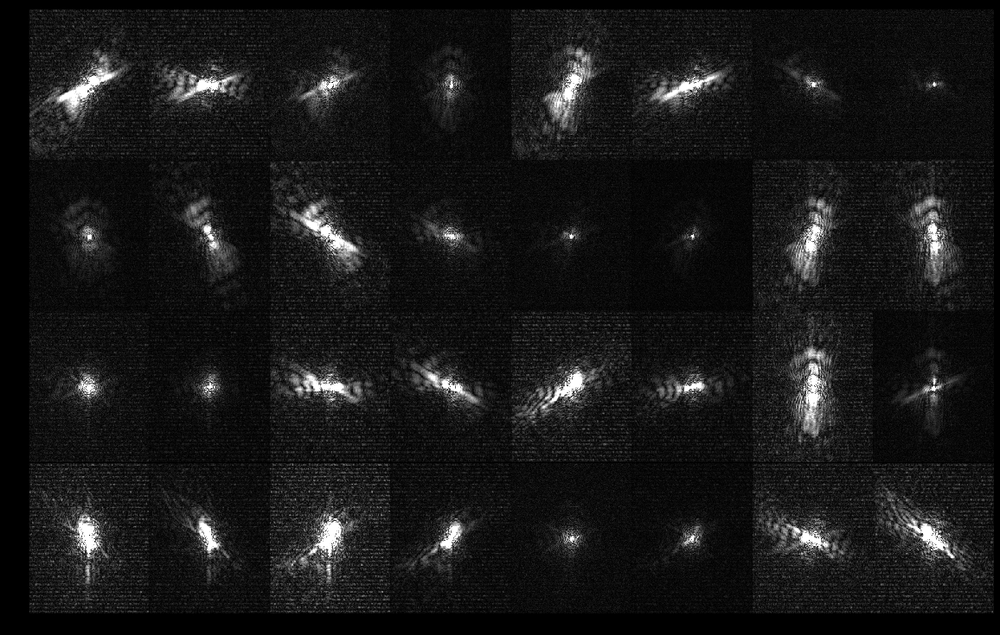

In [57]:
kspace_corrected = np.zeros(kspace_grappa[0,:,:,:].shape, kspace_grappa.dtype)
kspace_corrected[:,:,:] = kspace_grappa[0,:,:,:]
mosaic(kspace_corrected, 4, 8, 1, [0,50], fig_size=(20,20), num_rot=0)

In [58]:
for chan in range(0,num_chan):
        correction_real_name = 'correction' + str(chan) + 'r'
        correction_imag_name = 'correction' + str(chan) + 'i' 

        kspace_corrected[chan, :, :] = ((((correction_real[correction_real_name])[0, 0, :, :])/chan_scale_factors_real[chan]) \
                                        + 1j*(((correction_imag[correction_imag_name])[0, 0, :, :])/chan_scale_factors_imag[chan])) + kspace_grappa[0,chan,:,:]

print('kspace_corrected shape: ' + str(kspace_corrected.shape))
print('kspace_corrected dtype: ' + str(kspace_corrected.dtype))

kspace_corrected shape: (32, 236, 188)
kspace_corrected dtype: complex64


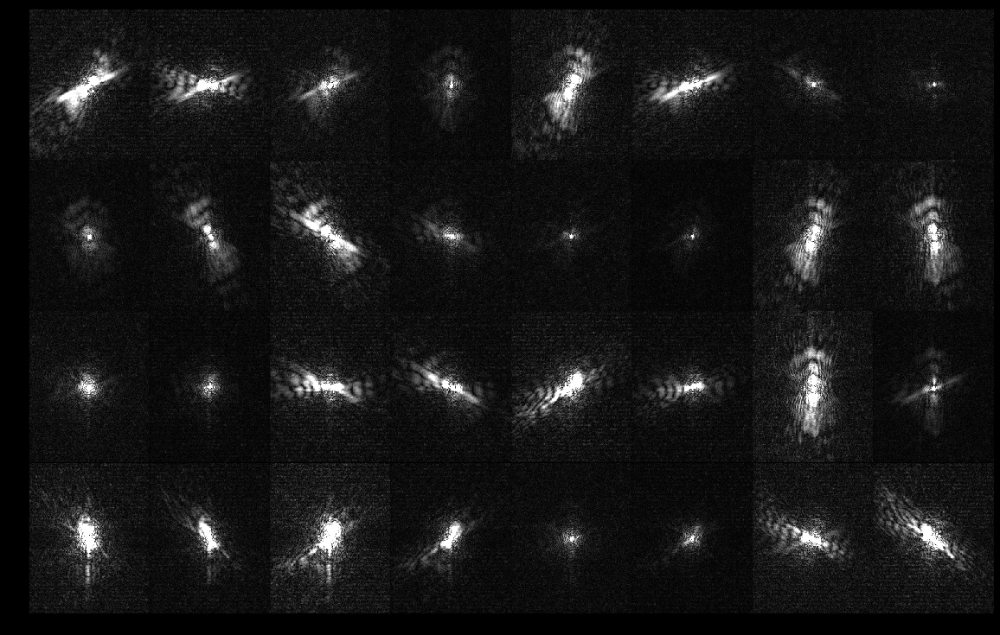

In [59]:
mosaic(kspace_corrected, 4, 8, 1, [0,50], fig_size=(20,20), num_rot=0)

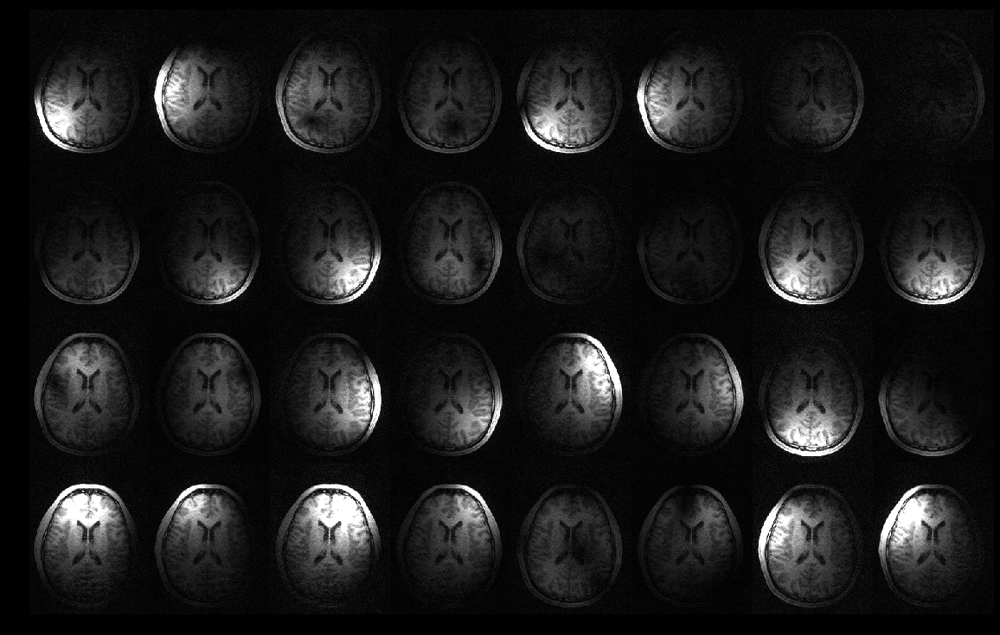

In [60]:
corrected_coil_images = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(kspace_corrected, axes=(1,2)), axes=(1,2)), axes=(1,2))
mosaic(corrected_coil_images, 4, 8, 1, [0,0.4], fig_size=(20,20), num_rot=0)

rmse_spark: 0.07115554
Original Image, SPARK Corrected Image


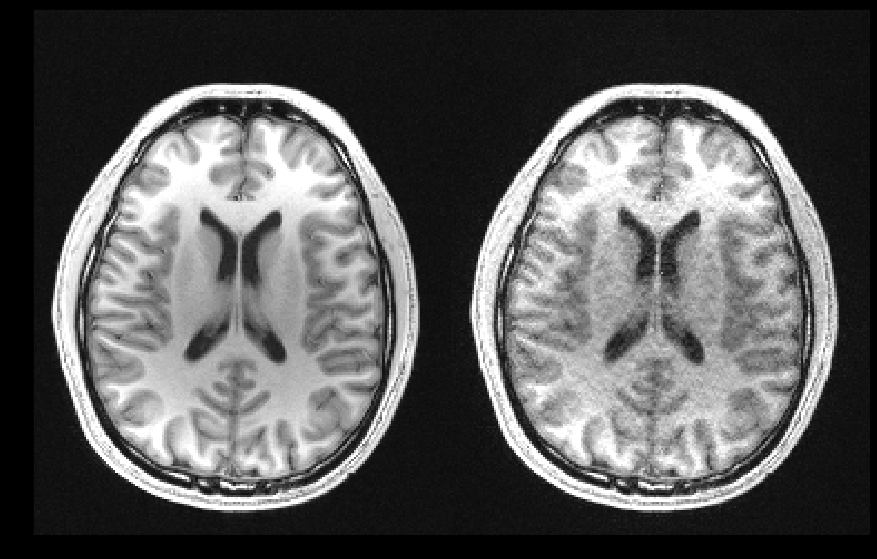

In [61]:
# Show original and reconstructed images (original on left)
corrected_rssq_image = np.sqrt(np.sum(np.square(np.abs(corrected_coil_images)),axis=0))
comparison_spark = np.concatenate((np.expand_dims(image_original, axis=0),np.expand_dims(corrected_rssq_image, axis=0)),axis=0)
rmse_spark = np.sqrt(np.sum(np.square(image_original - corrected_rssq_image))) / np.sqrt(np.sum(np.square(image_original)))

print('rmse_spark: ' + str(rmse_spark))
print('Original Image, SPARK Corrected Image')

mosaic(comparison_spark, 1, 2, 1, [0,1], fig_size=(15,15), num_rot=0)

#### Substitute in Sampled Lines and ACS

In [62]:
acs_mask = np.zeros((num_chan, N1, N2), dtype=bool)
acs_mask[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y] = True

sampling_mask = np.zeros((num_chan, N1, N2), dtype=bool)
sampling_mask[:,0:N1:Rx,:] = True

rmse_spark: 0.07039160227451516
Original Image, SPARK Image


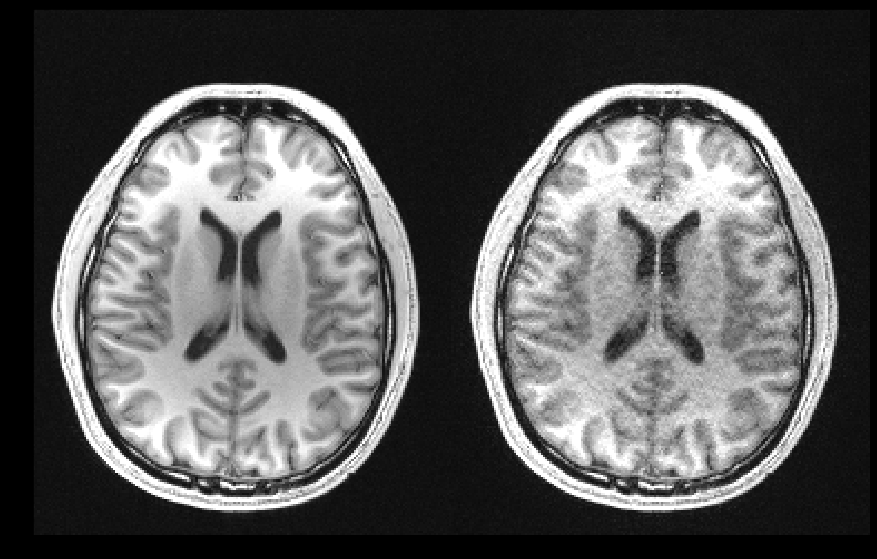

In [63]:
# Substitute Sampled Lines
kspace_corrected_sub1 = (kspace_corrected * np.invert(sampling_mask).astype(int)) + kspace_undersampled_zero_filled[:,:,:]

corrected_coil_images_sub1 = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(kspace_corrected_sub1, axes=(1,2)), axes=(1,2)), axes=(1,2))
corrected_rssq_image_sub1 = np.sqrt(np.sum(np.square(np.abs(corrected_coil_images_sub1)),axis=0))
comparison_spark = np.concatenate((np.expand_dims(image_original, axis=0),np.expand_dims(corrected_rssq_image_sub1, axis=0)),axis=0)
rmse_spark = np.sqrt(np.sum(np.square(image_original - corrected_rssq_image_sub1))) / np.sqrt(np.sum(np.square(image_original)))

print('rmse_spark: ' + str(rmse_spark))
print('Original Image, SPARK Image')

mosaic(comparison_spark, 1, 2, 1, [0,1], fig_size=(15,15), num_rot=0)

rmse_spark: 0.07040286338905757
Original Image, SPARK Image


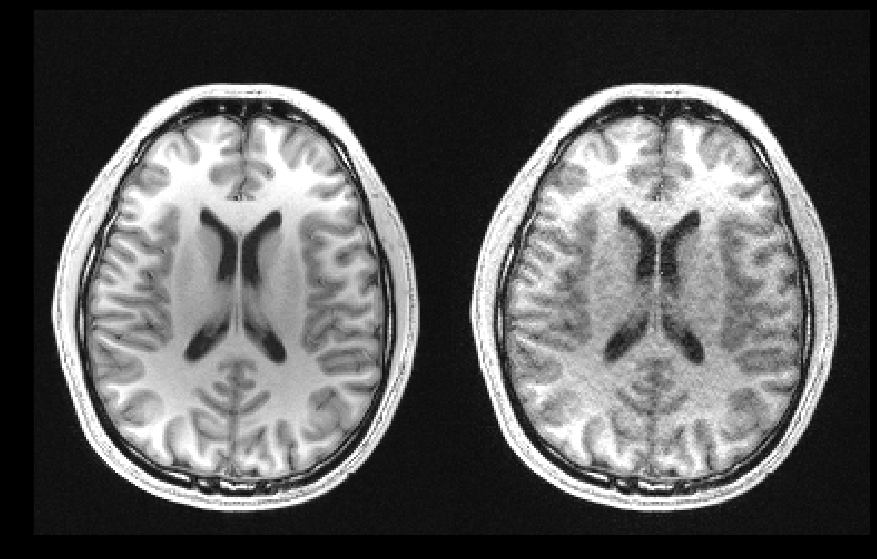

In [64]:
# Substitute ACS
kspace_corrected_sub2 = (kspace_corrected_sub1 * np.invert(acs_mask).astype(int)) + kspace_acs_zero_filled[:,:,:]

corrected_coil_images_sub2 = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(kspace_corrected_sub2, axes=(1,2)), axes=(1,2)), axes=(1,2))
corrected_rssq_image_sub2 = np.sqrt(np.sum(np.square(np.abs(corrected_coil_images_sub2)),axis=0))
comparison_spark = np.concatenate((np.expand_dims(image_original, axis=0),np.expand_dims(corrected_rssq_image_sub2, axis=0)),axis=0)
rmse_spark = np.sqrt(np.sum(np.square(image_original - corrected_rssq_image_sub2))) / np.sqrt(np.sum(np.square(image_original)))

print('rmse_spark: ' + str(rmse_spark))
print('Original Image, SPARK Image')

mosaic(comparison_spark, 1, 2, 1, [0,1], fig_size=(15,15), num_rot=0)

### Iteration 1 Results

Original Image, GRAPPA Image, SPARK Image


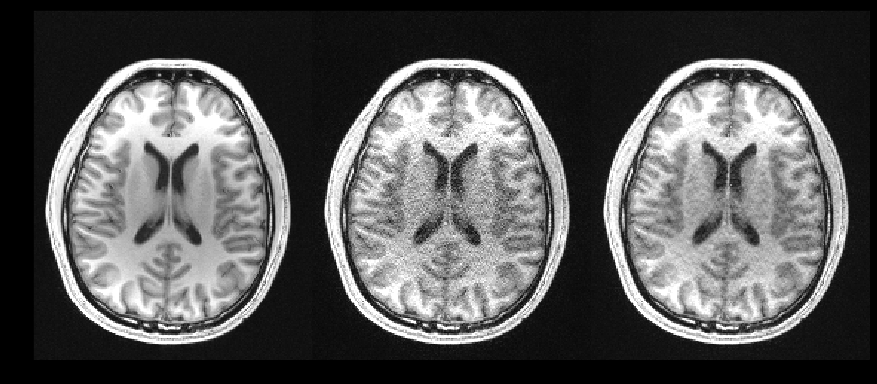

In [65]:
comparison_spark = np.concatenate((np.expand_dims(image_original, axis=0), np.expand_dims(grappa_rssq_image_sub, axis=0), np.expand_dims(corrected_rssq_image_sub2, axis=0)),axis=0)

print('Original Image, GRAPPA Image, SPARK Image')
mosaic(comparison_spark, 1, 3, 1, [0,1], fig_size=(15,15), num_rot=0)

Original Kspace, GRAPPA Kspace, SPARK Kspace


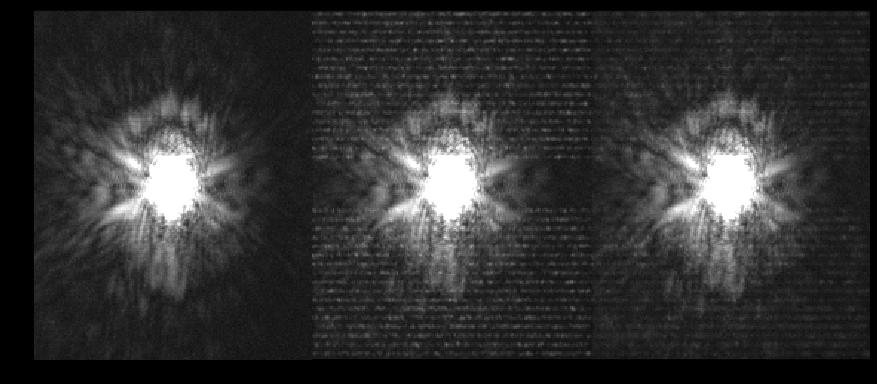

In [66]:
# Get the rssq corrected kspace

kspace_spark_rssq = np.sqrt(np.sum(np.square(np.abs(kspace_corrected_sub2)),axis=0))
comparison_spark_kspace = np.concatenate((np.expand_dims(kspace_original, axis=0), np.expand_dims(kspace_grappa_rssq, axis=0), np.expand_dims(kspace_spark_rssq, axis=0)), axis = 0)

print('Original Kspace, GRAPPA Kspace, SPARK Kspace')
mosaic(comparison_spark_kspace , 1, 3, 1, [0,150], fig_size=(15,15), num_rot=0)

## Iteration 2

### Initial GRAPPA Recon

In [ ]:
grappa_coil_images_without_sub_iter2 = np.zeros(kspace_undersampled_zero_filled.shape, kspace_undersampled_zero_filled.dtype)
grappa_coil_kspaces_without_sub_iter2 = np.zeros(kspace_undersampled_zero_filled.shape, dtype=kspace_undersampled_zero_filled.dtype)

num_acs_iter = (N1,N2)
grappa_coil_kspaces_without_sub_iter2, grappa_coil_images_without_sub_iter2 = grappa(kspace_undersampled_zero_filled, kspace_corrected_sub2, 
                                                                                     Rx, 1, num_acs_iter, grappa_shift_x, grappa_shift_y, kernel_size=np.array([3, 13]), lambda_tik=0)

Axis Labels: [num_coils, N1, N2]
GRAPPA Coil Images Shape: (32, 236, 188)
GRAPPA Coil Images Data Type: complex128

Axis Labels: [N1, N2]
GRAPPA RSSQ Image Shape: (236, 188)
GRAPPA RSSQ Image Data Type: float64

rmse_grappa: 0.08935721177049166

Original Image, GRAPPA Image


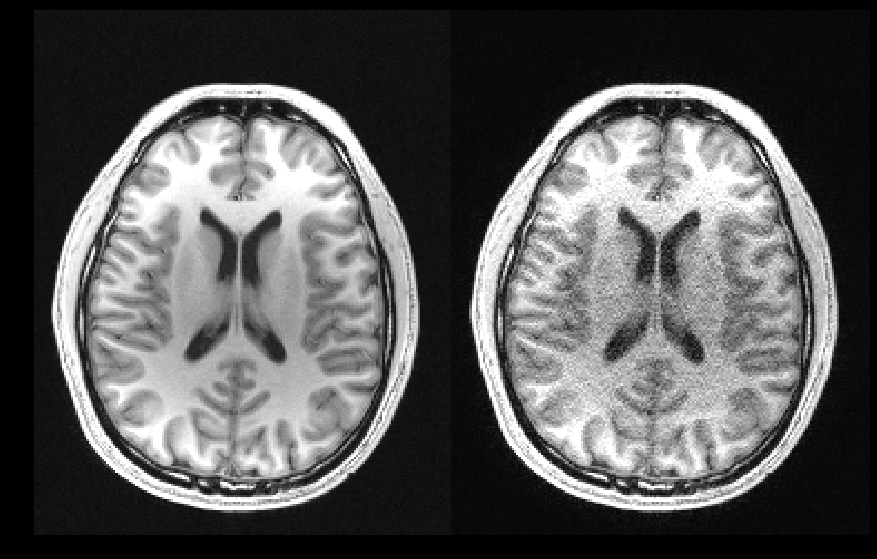

In [68]:
# Substitute ACS

acs_mask = np.zeros((num_chan, N1, N2), dtype=bool)
acs_mask[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y] = True

grappa_coil_kspaces_sub_iter2 = (grappa_coil_kspaces_without_sub_iter2 * np.invert(acs_mask).astype(int)) + kspace_acs_zero_filled[:,:,:]

grappa_coil_images_sub_iter2 = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(grappa_coil_kspaces_sub_iter2, axes=(1,2)), axes=(1,2)), axes=(1,2))

# Visualize
print('Axis Labels: ' + '[num_coils, N1, N2]')
print('GRAPPA Coil Images Shape: ' + str(grappa_coil_images_sub_iter2.shape))
print('GRAPPA Coil Images Data Type: ' + str(grappa_coil_images_sub_iter2.dtype))
print()

grappa_rssq_image_sub_iter2 = np.sqrt(np.sum(np.square(np.abs(grappa_coil_images_sub_iter2)),axis=0))

# Visualize
print('Axis Labels: ' + '[N1, N2]')
print('GRAPPA RSSQ Image Shape: ' + str(grappa_rssq_image_sub_iter2.shape))
print('GRAPPA RSSQ Image Data Type: ' + str(grappa_rssq_image_sub_iter2.dtype))
print()

comparison_grappa = np.concatenate((np.expand_dims(image_original, axis=0), np.expand_dims(grappa_rssq_image_sub_iter2, axis=0)), axis = 0)
rmse_grappa_sub_iter2 = np.sqrt(np.sum(np.square(image_original - grappa_rssq_image_sub_iter2))) / np.sqrt(np.sum(np.square(image_original)))

print('rmse_grappa: ' + str(rmse_grappa_sub_iter2))
print()
print('Original Image, GRAPPA Image')
mosaic(comparison_grappa , 1, 2, 1, [0,1], fig_size=(15,15), num_rot=0)

### Kspace Artifact Reduction Using SPARK

#### Get the ACS Difference

In [69]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

Axis Labels: [num_coils, N1, N2]
acs_difference Shape: (32, 30, 188)
acs_difference Data Type: complex64


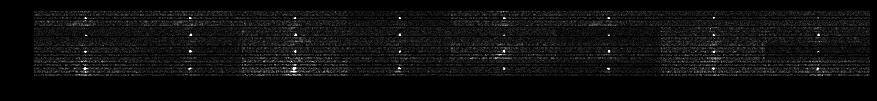

In [70]:
# Get the ACS Difference

acs_grappa = np.zeros([num_chan, num_acs[0], num_acs[1]], dtype=grappa_coil_kspaces_without_sub_iter2.dtype)
acs_grappa[:,:,:] = grappa_coil_kspaces_without_sub_iter2[:,acs_start_index_x:acs_end_index_x,acs_start_index_y:acs_end_index_y]

acs_difference = kspace_acs_cropped - acs_grappa

# Visualize
print('Axis Labels: ' + '[num_coils, N1, N2]')
print('acs_difference Shape: ' + str(acs_difference.shape))
print('acs_difference Data Type: ' + str(acs_difference.dtype))

mosaic(acs_difference, 4, 8, 1, [0,30], fig_size=(15,15), num_rot=0)

#### Split Real and Imaginary Parts

In [71]:
# Split Real and Imaginary Parts

acs_difference_real = np.real(acs_difference)
acs_difference_imag = np.imag(acs_difference)

print('acs_difference_real shape: ' + str(acs_difference_real.shape))
print('acs_difference_imag shape: ' + str(acs_difference_imag.shape))

# Add the batch dimension
kspace_grappa = np.expand_dims(grappa_coil_kspaces_without_sub_iter2,axis=0)
kspace_grappa_real = np.real(kspace_grappa)
kspace_grappa_imag = np.imag(kspace_grappa)
kspace_grappa_split = np.concatenate((kspace_grappa_real, kspace_grappa_imag), axis=1)

print('kspace_grappa_split shape: ' + str(kspace_grappa_split.shape))

acs_difference_real shape: (32, 30, 188)
acs_difference_imag shape: (32, 30, 188)
kspace_grappa_split shape: (1, 64, 236, 188)


#### Normalize

In [72]:
print('kspace_grappa_split max: ' + str(np.amax(np.abs(kspace_grappa_split))))
print('acs_difference_real max: ' + str(np.amax(np.abs(acs_difference_real))))
print('acs_difference_imag  max: ' + str(np.amax(np.abs(acs_difference_imag))))

kspace_grappa_split max: 2715.147
acs_difference_real max: 277.8291
acs_difference_imag  max: 127.69495


In [73]:
# Normalize
scale_factor_input = 1/np.amax(np.abs(kspace_grappa_split))
kspace_grappa_split *= scale_factor_input

In [ ]:
chan_scale_factors_real = []
chan_scale_factors_imag = []

for chan in range(num_chan):
    scale_factor_real = 1/np.amax(np.abs(acs_difference_real[chan,:,:]))
    scale_factor_imag = 1/np.amax(np.abs(acs_difference_imag[chan,:,:]))
    
    chan_scale_factors_real.append(scale_factor_real)
    chan_scale_factors_imag.append(scale_factor_imag)
    
    acs_difference_real[chan,:,:] = acs_difference_real[chan,:,:] * scale_factor_real
    acs_difference_imag[chan,:,:] = acs_difference_imag[chan,:,:] * scale_factor_imag
    
print('kspace_grappa_split max: ' + str(np.amax(np.abs(kspace_grappa_split))))

for chan in range(num_chan):
    print('acs_difference_real_chan' + str(chan+1) + ' max: ' + str(np.amax(np.abs(acs_difference_real[chan,:,:]))))
    print('acs_difference_imag_chan' + str(chan+1) + ' max: ' + str(np.amax(np.abs(acs_difference_imag[chan,:,:]))))

#### Add Batch/Color Dimensions and Pass Data to GPU

In [75]:
acs_difference_real = np.expand_dims(acs_difference_real, axis=1)
acs_difference_real = np.expand_dims(acs_difference_real, axis=1)
acs_difference_imag = np.expand_dims(acs_difference_imag, axis=1)
acs_difference_imag = np.expand_dims(acs_difference_imag, axis=1)

print('acs_difference_real shape: ' + str(acs_difference_real.shape))
print('acs_difference_imag shape: ' + str(acs_difference_imag.shape))

acs_difference_real shape: (32, 1, 1, 30, 188)
acs_difference_imag shape: (32, 1, 1, 30, 188)


In [ ]:
# Print GPU Info

print("PYTORCH:")
print("---------------------------------------------------------")

print('GPU Available: ' + str(torch.cuda.is_available()))
print('Current Device: ' + str(torch.cuda.current_device()))
print('Number of GPU\'s available: ' + str(torch.cuda.device_count()))

gpu_num = torch.cuda.device_count()
for i in range(0, gpu_num):
    print('GPU found: ' + str(torch.cuda.device(0)))
    print('GPU:%d ' % i + str(torch.cuda.get_device_name(i)))

print("---------------------------------------------------------")   

print("NVIDIA:")
for gpu in iter(nvgpu.gpu_info()):
    print("---------------------------------------------------------")
    for name, value in gpu.items():
        print(str(name) + ': ' + str(value))

print("---------------------------------------------------------")    

In [77]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

kspace_grappa_split = torch.from_numpy(kspace_grappa_split)
kspace_grappa_split = kspace_grappa_split.to(device, dtype=torch.float)
print('kspace_grappa_split shape: ' + str(kspace_grappa_split.shape))

acs_difference_real = torch.from_numpy(acs_difference_real)
acs_difference_real = acs_difference_real.to(device, dtype=torch.float)
print('acs_difference_real shape: ' + str(acs_difference_real.shape))

acs_difference_imag = torch.from_numpy(acs_difference_imag)
acs_difference_imag = acs_difference_imag.to(device, dtype=torch.float)
print('acs_target_imag shape: ' + str(acs_difference_imag.shape))

kspace_grappa_split shape: torch.Size([1, 64, 236, 188])
acs_difference_real shape: torch.Size([32, 1, 1, 30, 188])
acs_target_imag shape: torch.Size([32, 1, 1, 30, 188])


#### Define and Train Networks

In [78]:
net = SPARK_Net()
net.to(device)

SPARK_Net(
  (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv2): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv4): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv5): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv6): Conv2d(8, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
)

SPARK_Net(
  (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv2): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv4): Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (conv5): Conv2d(32, 8, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (conv6): Conv2d(8, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
)
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 236, 188]          36,864
            Conv2d-2         [-1, 32, 236, 188]           2,048
            Conv2d-3         [-1, 64, 236, 188]          18,432
            Conv2d-4         [-1, 32, 236, 188]          18,432
            Conv2d-5          [-1, 8, 236, 188]             256
            Conv2d-6          [-1, 1, 2

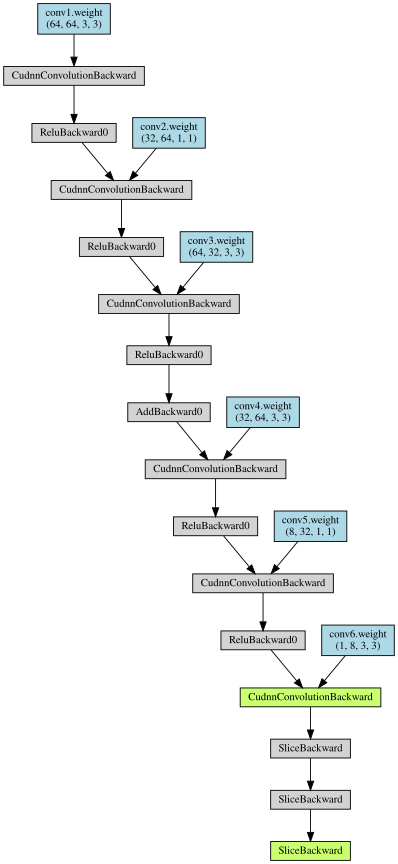

In [79]:
## Visualization Block

input_size = kspace_grappa_split.shape[1:4]
input_size_batch = kspace_grappa_split.shape
#Summary
print(net)
summary(net, input_size)
#Layer parameters
net_named_params = dict(net.named_parameters()) #parameters with name and grad
for name, parameter in net_named_params.items():
    print(name + ':')
    print(parameter.shape)
    #print(parameter)
print('\n')   
#Visualization
net_test_in = torch.randn(input_size_batch).to("cuda")
net_test_out = net(net_test_in)
print('Input Shape: ' + str(net_test_in.shape))
print('Output1 Shape: ' + str(net_test_out[0].shape))
print('Output2 Shape: ' + str(net_test_out[1].shape))
make_dot(net_test_out,params=dict(net.named_parameters()))

In [80]:
criterion = nn.MSELoss()
num_iter = 250

In [ ]:
# Train real models
real_models = {}
real_model_names = []

for model_num in range(0,num_chan):
    
    model_name = 'model' + str(model_num) + 'r'
    model = SPARK_Net()
    model.to(device)
    
    warnings.filterwarnings('ignore')
    
    print()
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print(r'___________             .__       .__                    _____             .___     .__ ')
    print(r'\__    ___/___________  |__| ____ |__| ____    ____     /     \   ____   __| _/____ |  |')
    print(r'  |    |  \_  __ \__  \ |  |/    \|  |/    \  / ___\   /  \ /  \ /  _ \ / __ |/ __ \|  |')
    print(r'  |    |   |  | \// __ \|  |   |  \  |   |  \/ /_/  > /    Y    (  <_> ) /_/ \  ___/|  |__')
    print(r'  |____|   |__|  (____  /__|___|  /__|___|  /\___  /  \____|__  /\____/\____ |\___  >____/')
    print(r'                      \/        \/        \//_____/           \/            \/    \/      ')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('-----------------------------------Training ' + model_name + '------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print()
    
    warnings.filterwarnings('default')
        
    optimizer = optim.Adam(model.parameters(),lr=0.01)
    running_loss = 0.0
    
    for epoch in range(num_iter):
    
        optimizer.zero_grad()

        _, loss_out = model(kspace_grappa_split)
        loss = criterion(loss_out, acs_difference_real[model_num, :, :, :]) 
        loss.backward()
        optimizer.step()

        running_loss = loss.item()
    
        print('[Epoch: %5d] loss = %f' % (epoch+1, running_loss))
                           
    print('Training Complete')
    
    optimizer = optim.Adam(model.parameters(),lr=0.001)
    running_loss = 0.0
    
    for epoch in range(num_iter):
    
        optimizer.zero_grad()

        _, loss_out = model(kspace_grappa_split)
        loss = criterion(loss_out, acs_difference_real[model_num, :, :, :]) 
        loss.backward()
        optimizer.step()

        running_loss = loss.item()
    
        print('[Epoch: %5d] loss = %f' % (epoch+1, running_loss))
                           
    print('Training Complete')
    
    real_model_names.append(model_name)
    real_models.update({model_name : model})

In [ ]:
# Train imaginary models
imag_models = {}
imag_model_names = []

for model_num in range(0,num_chan):
    
    model_name = 'model' + str(model_num) + 'i'
    model = SPARK_Net()
    model.to(device)
    
    warnings.filterwarnings('ignore')
    
    print()
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print(r'___________             .__       .__                    _____             .___     .__ ')
    print(r'\__    ___/___________  |__| ____ |__| ____    ____     /     \   ____   __| _/____ |  |')
    print(r'  |    |  \_  __ \__  \ |  |/    \|  |/    \  / ___\   /  \ /  \ /  _ \ / __ |/ __ \|  |')
    print(r'  |    |   |  | \// __ \|  |   |  \  |   |  \/ /_/  > /    Y    (  <_> ) /_/ \  ___/|  |__')
    print(r'  |____|   |__|  (____  /__|___|  /__|___|  /\___  /  \____|__  /\____/\____ |\___  >____/')
    print(r'                      \/        \/        \//_____/           \/            \/    \/      ')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('-----------------------------------Training ' + model_name + '------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print('---------------------------------------------------------------------------------------')
    print()
    
    warnings.filterwarnings('default')
        
    optimizer = optim.Adam(model.parameters(),lr=0.01)
    running_loss = 0.0
    
    for epoch in range(num_iter):
    
        optimizer.zero_grad()

        _, loss_out = model(kspace_grappa_split)
        loss = criterion(loss_out, acs_difference_imag[model_num, :, :, :]) 
        loss.backward()
        optimizer.step()

        running_loss = loss.item()
    
        print('[Epoch: %5d] loss = %f' % (epoch+1, running_loss))
                  
    print('Training Complete')
    
    optimizer = optim.Adam(model.parameters(),lr=0.001)
    running_loss = 0.0
    
    for epoch in range(num_iter):
    
        optimizer.zero_grad()

        _, loss_out = model(kspace_grappa_split)
        loss = criterion(loss_out, acs_difference_imag[model_num, :, :, :]) 
        loss.backward()
        optimizer.step()

        running_loss = loss.item()
    
        print('[Epoch: %5d] loss = %f' % (epoch+1, running_loss))
                           
    print('Training Complete')
    
    imag_model_names.append(model_name)
    imag_models.update({model_name : model})

#### Recon

In [83]:
correction_real = {}
correction_real_names = []

for model_num in range(0,num_chan):
    
    model_name = 'model' + str(model_num) + 'r'
    correction_name = 'correction' + str(model_num) + 'r'
    
    correction = real_models[model_name](kspace_grappa_split)[0].cpu().detach().numpy()
    
    print(correction_name + ' shape: ' + str(correction.shape))
    
    correction_real_names.append(correction_name)
    correction_real.update({correction_name : correction})

correction0r shape: (1, 1, 236, 188)
correction1r shape: (1, 1, 236, 188)
correction2r shape: (1, 1, 236, 188)
correction3r shape: (1, 1, 236, 188)
correction4r shape: (1, 1, 236, 188)
correction5r shape: (1, 1, 236, 188)
correction6r shape: (1, 1, 236, 188)
correction7r shape: (1, 1, 236, 188)
correction8r shape: (1, 1, 236, 188)
correction9r shape: (1, 1, 236, 188)
correction10r shape: (1, 1, 236, 188)
correction11r shape: (1, 1, 236, 188)
correction12r shape: (1, 1, 236, 188)
correction13r shape: (1, 1, 236, 188)
correction14r shape: (1, 1, 236, 188)
correction15r shape: (1, 1, 236, 188)
correction16r shape: (1, 1, 236, 188)
correction17r shape: (1, 1, 236, 188)
correction18r shape: (1, 1, 236, 188)
correction19r shape: (1, 1, 236, 188)
correction20r shape: (1, 1, 236, 188)
correction21r shape: (1, 1, 236, 188)
correction22r shape: (1, 1, 236, 188)
correction23r shape: (1, 1, 236, 188)
correction24r shape: (1, 1, 236, 188)
correction25r shape: (1, 1, 236, 188)
correction26r shape: (

In [84]:
correction_imag = {}
correction_imag_names = []

for model_num in range(0,num_chan):
    
    model_name = 'model' + str(model_num) + 'i'
    correction_name = 'correction' + str(model_num) + 'i'
    
    correction = imag_models[model_name](kspace_grappa_split)[0].cpu().detach().numpy()
    
    print(correction_name + ' shape: ' + str(correction.shape))
    
    correction_imag_names.append(correction_name)
    correction_imag.update({correction_name : correction})

correction0i shape: (1, 1, 236, 188)
correction1i shape: (1, 1, 236, 188)
correction2i shape: (1, 1, 236, 188)
correction3i shape: (1, 1, 236, 188)
correction4i shape: (1, 1, 236, 188)
correction5i shape: (1, 1, 236, 188)
correction6i shape: (1, 1, 236, 188)
correction7i shape: (1, 1, 236, 188)
correction8i shape: (1, 1, 236, 188)
correction9i shape: (1, 1, 236, 188)
correction10i shape: (1, 1, 236, 188)
correction11i shape: (1, 1, 236, 188)
correction12i shape: (1, 1, 236, 188)
correction13i shape: (1, 1, 236, 188)
correction14i shape: (1, 1, 236, 188)
correction15i shape: (1, 1, 236, 188)
correction16i shape: (1, 1, 236, 188)
correction17i shape: (1, 1, 236, 188)
correction18i shape: (1, 1, 236, 188)
correction19i shape: (1, 1, 236, 188)
correction20i shape: (1, 1, 236, 188)
correction21i shape: (1, 1, 236, 188)
correction22i shape: (1, 1, 236, 188)
correction23i shape: (1, 1, 236, 188)
correction24i shape: (1, 1, 236, 188)
correction25i shape: (1, 1, 236, 188)
correction26i shape: (

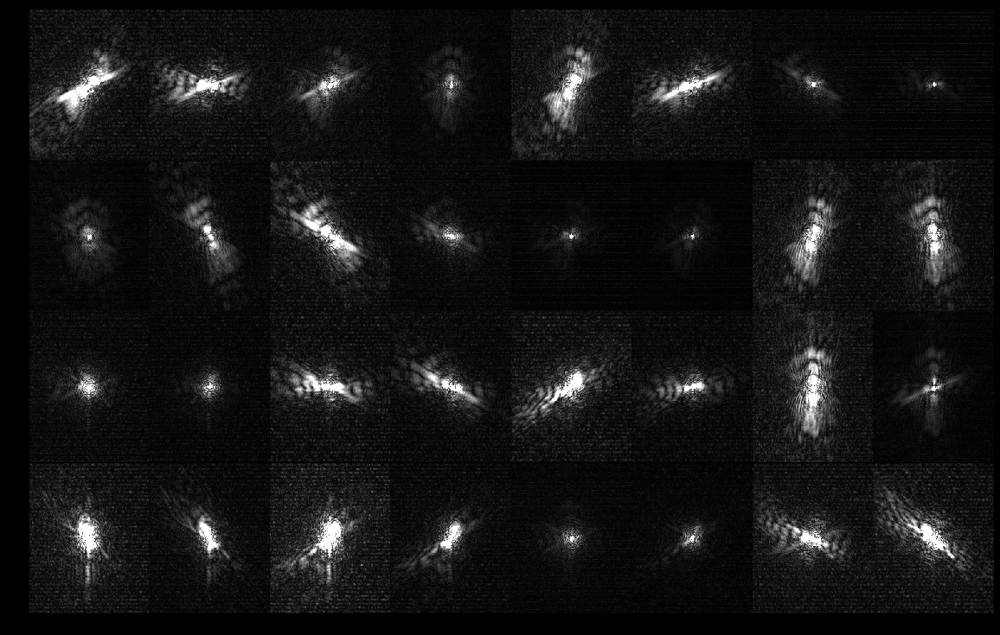

In [85]:
kspace_corrected = np.zeros(kspace_grappa[0,:,:,:].shape, kspace_grappa.dtype)
kspace_corrected[:,:,:] = kspace_grappa[0,:,:,:]
mosaic(kspace_corrected, 4, 8, 1, [0,50], fig_size=(20,20), num_rot=0)

In [86]:
for chan in range(0,num_chan):
        correction_real_name = 'correction' + str(chan) + 'r'
        correction_imag_name = 'correction' + str(chan) + 'i' 

        kspace_corrected[chan, :, :] = ((((correction_real[correction_real_name])[0, 0, :, :])/chan_scale_factors_real[chan]) \
                                        + 1j*(((correction_imag[correction_imag_name])[0, 0, :, :])/chan_scale_factors_imag[chan])) + kspace_grappa[0,chan,:,:]

print('kspace_corrected shape: ' + str(kspace_corrected.shape))
print('kspace_corrected dtype: ' + str(kspace_corrected.dtype))

kspace_corrected shape: (32, 236, 188)
kspace_corrected dtype: complex64


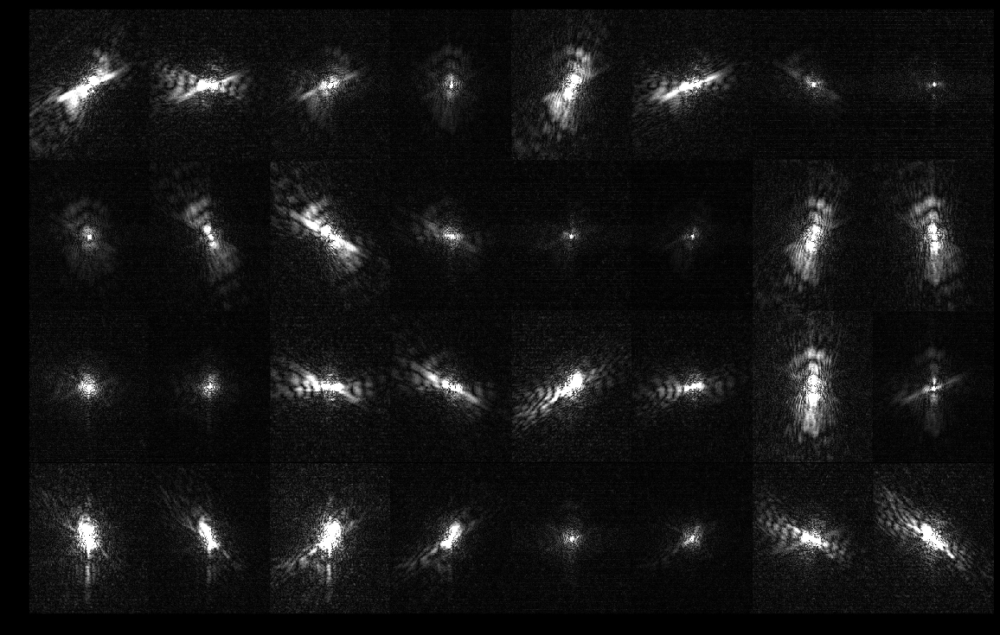

In [87]:
mosaic(kspace_corrected, 4, 8, 1, [0,50], fig_size=(20,20), num_rot=0)

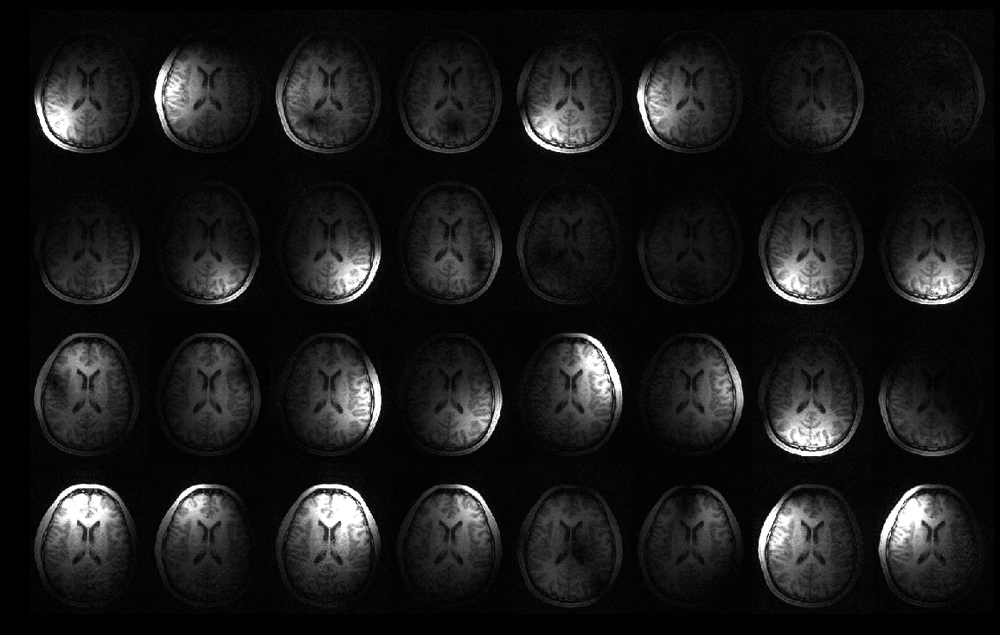

In [88]:
corrected_coil_images = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(kspace_corrected, axes=(1,2)), axes=(1,2)), axes=(1,2))
mosaic(corrected_coil_images, 4, 8, 1, [0,0.4], fig_size=(20,20), num_rot=0)

rmse_spark: 0.06402453
Original Image, SPARK Corrected Image


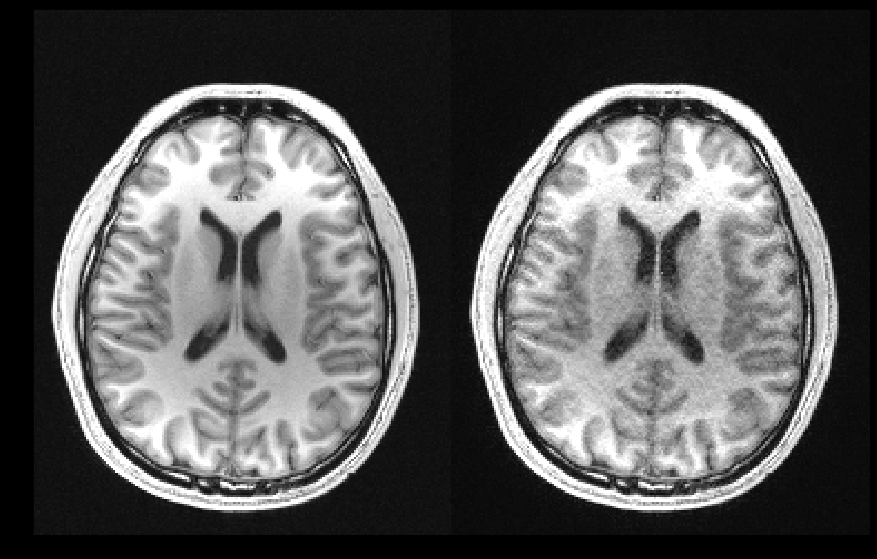

In [89]:
# Show original and reconstructed images (original on left)
corrected_rssq_image = np.sqrt(np.sum(np.square(np.abs(corrected_coil_images)),axis=0))
comparison_spark = np.concatenate((np.expand_dims(image_original, axis=0),np.expand_dims(corrected_rssq_image, axis=0)),axis=0)
rmse_spark = np.sqrt(np.sum(np.square(image_original - corrected_rssq_image))) / np.sqrt(np.sum(np.square(image_original)))

print('rmse_spark: ' + str(rmse_spark))
print('Original Image, SPARK Corrected Image')

mosaic(comparison_spark, 1, 2, 1, [0,1], fig_size=(15,15), num_rot=0)

#### Substitute in Sampled Lines and ACS

rmse_spark: 0.06367240863729272
Original Image, SPARK Image


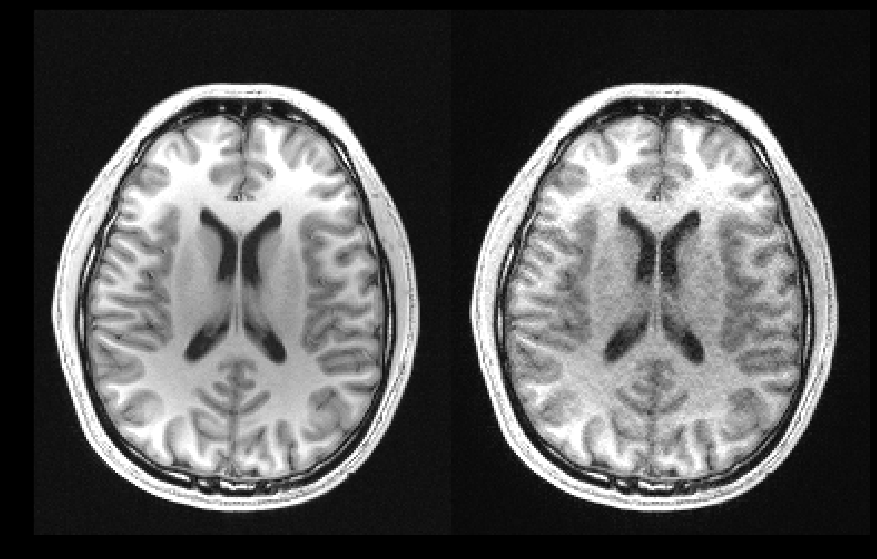

In [90]:
# Substitute Sampled Lines
kspace_corrected_sub1 = (kspace_corrected * np.invert(sampling_mask).astype(int)) + kspace_undersampled_zero_filled[:,:,:]

corrected_coil_images_sub1 = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(kspace_corrected_sub1, axes=(1,2)), axes=(1,2)), axes=(1,2))
corrected_rssq_image_sub1 = np.sqrt(np.sum(np.square(np.abs(corrected_coil_images_sub1)),axis=0))
comparison_spark = np.concatenate((np.expand_dims(image_original, axis=0),np.expand_dims(corrected_rssq_image_sub1, axis=0)),axis=0)
rmse_spark = np.sqrt(np.sum(np.square(image_original - corrected_rssq_image_sub1))) / np.sqrt(np.sum(np.square(image_original)))

print('rmse_spark: ' + str(rmse_spark))
print('Original Image, SPARK Image')

mosaic(comparison_spark, 1, 2, 1, [0,1], fig_size=(15,15), num_rot=0)

rmse_spark: 0.06350206391619809
Original Image, SPARK Image


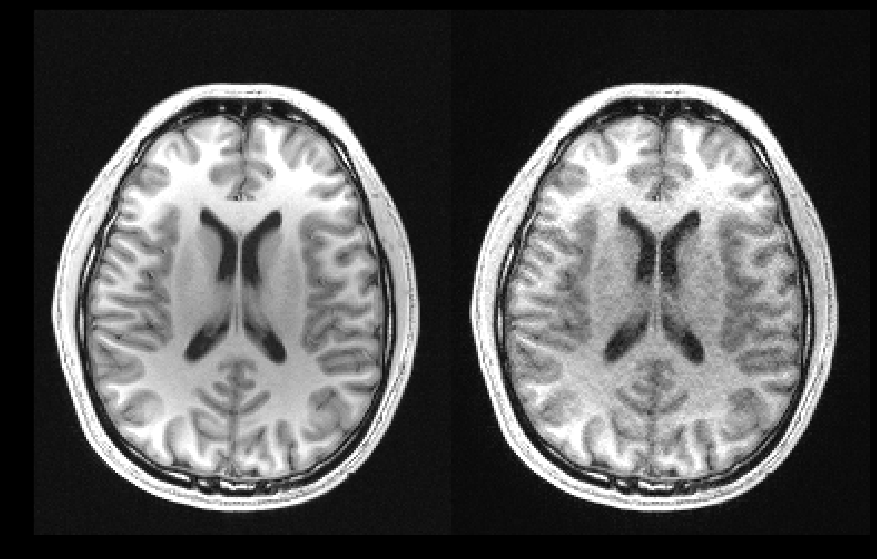

In [91]:
# Substitute ACS
kspace_corrected_sub2 = (kspace_corrected_sub1 * np.invert(acs_mask).astype(int)) + kspace_acs_zero_filled[:,:,:]

corrected_coil_images_sub2 = np.fft.fftshift(np.fft.ifft2(np.fft.ifftshift(kspace_corrected_sub2, axes=(1,2)), axes=(1,2)), axes=(1,2))
corrected_rssq_image_sub2 = np.sqrt(np.sum(np.square(np.abs(corrected_coil_images_sub2)),axis=0))
comparison_spark = np.concatenate((np.expand_dims(image_original, axis=0),np.expand_dims(corrected_rssq_image_sub2, axis=0)),axis=0)
rmse_spark = np.sqrt(np.sum(np.square(image_original - corrected_rssq_image_sub2))) / np.sqrt(np.sum(np.square(image_original)))

print('rmse_spark: ' + str(rmse_spark))
print('Original Image, SPARK Image')

mosaic(comparison_spark, 1, 2, 1, [0,1], fig_size=(15,15), num_rot=0)

# Final Results

Reconstruction Parameters
---------------------------------------------
Nx: 236
Ny: 188
ACS Size X: 30
ACS Size Y: 188
Rx: 6

RMSE
---------------------------------------------
RMSE GRAPPA: 0.10759319729484597
rmse_RAKI: 0.08682374
RMSE SPARK: 0.06350206391619809

Images
---------------------------------------------
Original Image, GRAPPA Image
RAKI Image, SPARK Image


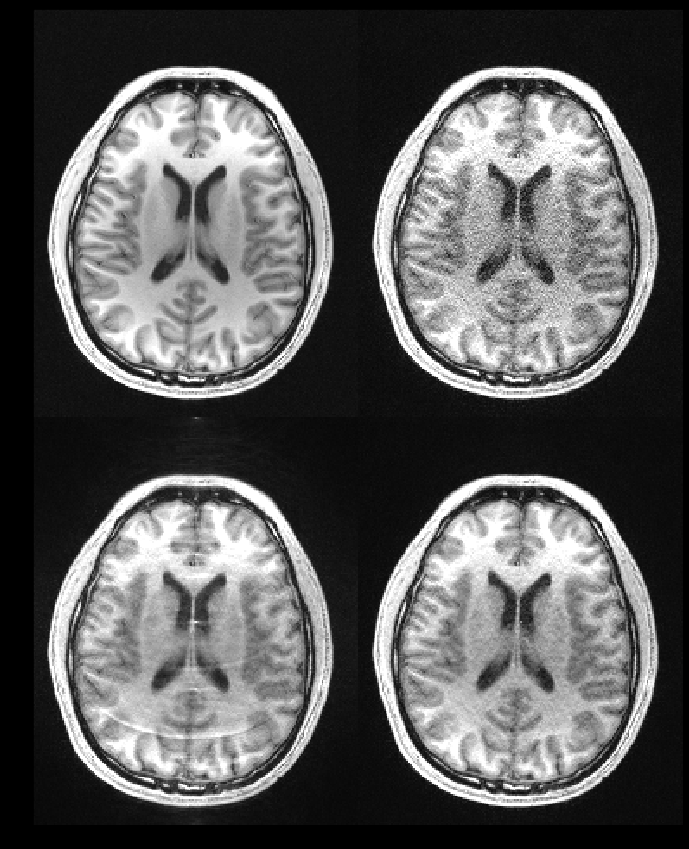

In [97]:
comparison_final = np.concatenate((np.expand_dims(image_original, axis=0), np.expand_dims(grappa_rssq_image_sub, axis=0),
                                   np.expand_dims(raki_rssq_image_sub, axis=0), np.expand_dims(corrected_rssq_image_sub2, axis=0)),axis=0)

print('Reconstruction Parameters')
print('---------------------------------------------')
print('Nx: ' + str(N1))
print('Ny: ' + str(N2))
print('ACS Size X: ' + str(num_acs[0]))
print('ACS Size Y: ' + str(num_acs[1]))
print('Rx: ' + str(Rx))
print()

print('RMSE')
print('---------------------------------------------')
print('RMSE GRAPPA: ' + str(rmse_grappa_sub))
print('rmse_RAKI: ' + str(rmse_raki_sub))
print('RMSE SPARK: ' + str(rmse_spark))
print()

print('Images')
print('---------------------------------------------')
print('Original Image, GRAPPA Image\nRAKI Image, SPARK Image')
mosaic(comparison_final, 2, 2, 1, [0,1], fig_size=(15,15), num_rot=0)